# Known biology: prevalence, Lift and tissue examples

Six literature-selected pairs, separate from automatic discovery and atlas alignment. Each index shows one direction in one organ; the reverse follows at the next index. Both directions use exactly the same eligible FOVs.

This is a retrospective consistency check, not a new independent validation. References motivate the relationship, not which spatial arrow must be stronger.


In [1]:
from pathlib import Path
import sys
import json
import pandas as pd
from IPython.display import display, Markdown

ROOT = next(p for p in (Path.cwd().resolve(), *Path.cwd().resolve().parents)
            if (p / "result_summary" / "data_helper.py").exists())
sys.path[:0] = [str(ROOT / "result_summary"), str(ROOT / "result_summary" / "differential_rules")]
import data_helper as dh
import biological_pairs as bp

STAGES = ["Control", "Mild", "Severe"]
SCORE = "Clinical score"
MIN_CELLS = 20
MIN_PATIENTS = 5
MINING_FDR = 0.05
pd.options.display.float_format = lambda value: f"{value:.4g}"
RUN_CONFIG = json.loads((Path(dh.RESULT_CSV_PATH).parent / "run_config.json").read_text())
RADIUS = RUN_CONFIG["settings"]["radius"]
print(dict(run=dh.RESULT_RUN, radius_um=RADIUS, min_cells_per_type=MIN_CELLS,
           mining_fdr=MINING_FDR, patient_test_min_n=MIN_PATIENTS,
           mining_fixed_labels=RUN_CONFIG["steps"].get("labels_kept_fixed", [])))

{'run': 'full_run/binary_CN_4_items_fixed_Epithelial', 'radius_um': 25.0, 'min_cells_per_type': 20, 'mining_fdr': 0.05, 'patient_test_min_n': 5, 'mining_fixed_labels': ['Epithelial']}


## Literature expectations

These named checks are explicitly authorized for Method proof. The full registry records sources, signaling direction, spatial expectations and limitations; it never feeds the automatic new-finding selector.

In [2]:
PAIRS = bp.load_pairs()
PAIR_SPECS = bp.pair_specs(PAIRS)
SPECS = bp.directional_specs(PAIR_SPECS)
display(pd.DataFrame(SPECS)[["organ", "rule", "source"]].rename_axis("index"))


,organ,rule,source
index,,,
0,Colon,Macrophage -> Fibroblast,https://doi.org/10.1038/s41467-024-46076-3
1,Colon,Fibroblast -> Macrophage,https://doi.org/10.1038/s41467-024-46076-3
2,Duodenum,Macrophage -> Fibroblast,https://doi.org/10.1038/s41467-024-46076-3
3,Duodenum,Fibroblast -> Macrophage,https://doi.org/10.1038/s41467-024-46076-3
4,Colon,Macrophage -> Neuron,https://doi.org/10.1016/j.cell.2014.04.050
5,Colon,Neuron -> Macrophage,https://doi.org/10.1016/j.cell.2014.04.050
6,Duodenum,Macrophage -> Neuron,https://doi.org/10.1016/j.cell.2014.04.050
7,Duodenum,Neuron -> Macrophage,https://doi.org/10.1016/j.cell.2014.04.050
8,Colon,Fibroblast -> Epithelial,https://doi.org/10.1038/s41586-018-0190-3


## How to read the results

**Prevalence:** attraction/avoidance FOVs divided by eligible FOVs (≥20 cells of both types), for the whole organ and separately by stage. A missing rule means no passing stored result, not proven biological absence. **Lift:** raw mined values only where a rule passes; 1 is the independence baseline, above 1 is attraction, below 1 avoidance. Dots are FOVs and diamonds medians. “All” pools the same fields shown by stage, not additional data.

**Patient evidence:** within each eligible FOV, subtract the reverse attraction indicator from the forward indicator. Average FOVs within biopsy, then biopsies within patient. Two-sided sign tests exclude ties and require ≥5 nonzero patients. Display FDR and patient counts; do not use FDR alone to select or hide results.

**Examples:** for each direction and stage, select the most frequent nonzero rule state, then the eligible FOV nearest its median Lift. Show the entire field and the same field with the pair highlighted. These are typical rule occurrences, not a claim that every field has the rule.

The earlier spatial checks remain in the final audit and the same joint BH family, so the reported patient FDRs stay comparable. They do not replace prevalence, Lift or tissue maps.


In [3]:
df_cells, df_fovs, _ = dh.load_spatial_data()
df_fovs = df_fovs[df_fovs[SCORE].isin(STAGES)].copy()
df_cells = df_cells[df_cells["fov"].isin(df_fovs["FOV"])]
raw = dh.load_results(rule_max_items=2, kind=None, max_fdr=MINING_FDR)
rules, states, eligibility, skipped_roles = bp.prepare_directional_rules(
    raw, df_cells, df_fovs, PAIRS, MIN_CELLS)
print(f"Excluded {skipped_roles} rows with other center/neighbor roles.")
print(f"Checking {len(PAIR_SPECS)} pair/organ combinations, both directions.")

Dropped 21 FOVs: Control_S


Loaded 598093 cells; FOVs: 267, biopsies: 73, patients: 71
Read results_CN_pairwise.csv
Loaded 16600 rules.
Kept 9719 rules at FDR <= 0.05.
Kept 9719 rules that add information.
Kept 9647 rules naming no Unidentified.


Kept 9647 rules (max_items=2, kind=None).


Excluded 0 rows with other center/neighbor roles.
Checking 11 pair/organ combinations, both directions.


In [4]:
diagnostics = bp.spatial_diagnostics(df_cells, df_fovs, PAIRS, eligibility, RADIUS, SCORE, states)
patients = bp.patient_values(diagnostics, STAGES, SCORE)
evidence = bp.sign_evidence(patients, MIN_PATIENTS)
occurrences = bp.occurrence_table(states, eligibility, df_fovs, PAIR_SPECS, STAGES, SCORE)
print(f"{evidence['p_value'].notna().sum()} tests in the joint BH family; no FDR-based display filter")
OUTPUT = ROOT / "result_summary" / "differential_rules" / "summary_downloads"
OUTPUT.mkdir(exist_ok=True)
occurrences.to_csv(OUTPUT / "biology_occurrences.csv", index=False)
evidence.to_csv(OUTPUT / "biology_patient_tests.csv", index=False)
diagnostics.to_csv(OUTPUT / "biology_fov_diagnostics.csv", index=False)


119 tests in the joint BH family; no FDR-based display filter


## Results

Each direction has the same simple summary followed by representative tissue maps. Gray in the state bars means eligible with no rule; purple means ineligible. The next index shows the reverse direction. Full counts and statistics remain visible even when FDR is not significant.


In [5]:
def show_selected(index):
    bp.show_selected(index, SPECS, rules, states, eligibility, df_cells, df_fovs,
                     evidence, occurrences, STAGES, SCORE)


**[0] Colon · Macrophage -> Fibroblast** — Intestinal fibroblast and macrophage subsets co-localize.

Fibroblast-derived GM-CSF supports monocyte-to-macrophage differentiation. [Source](https://doi.org/10.1038/s41467-024-46076-3) Human IBD evidence concerns specific subsets; these atlas labels are broader. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
0,All,97,0,22,12,0,8
2,Control,25,0,4,2,0,1
4,Mild,18,0,4,3,0,2
6,Severe,54,0,14,7,0,5


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Macrophage_to_Fibroblast_summary.pdf


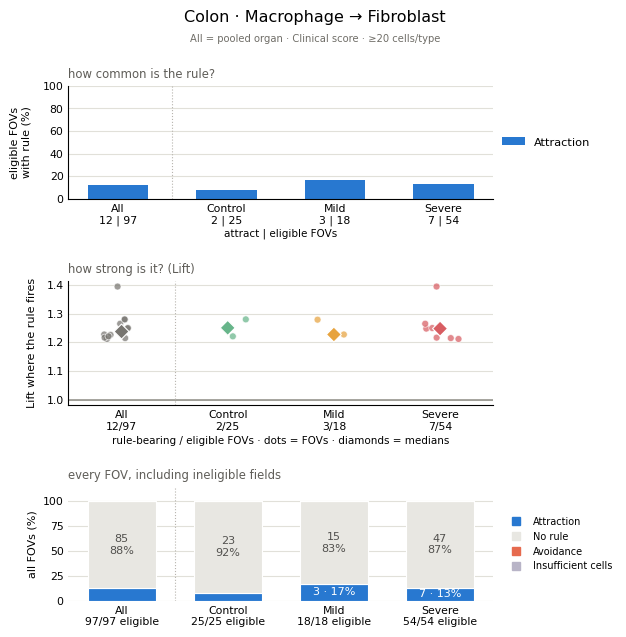

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Macrophage_to_Fibroblast_fovs.pdf


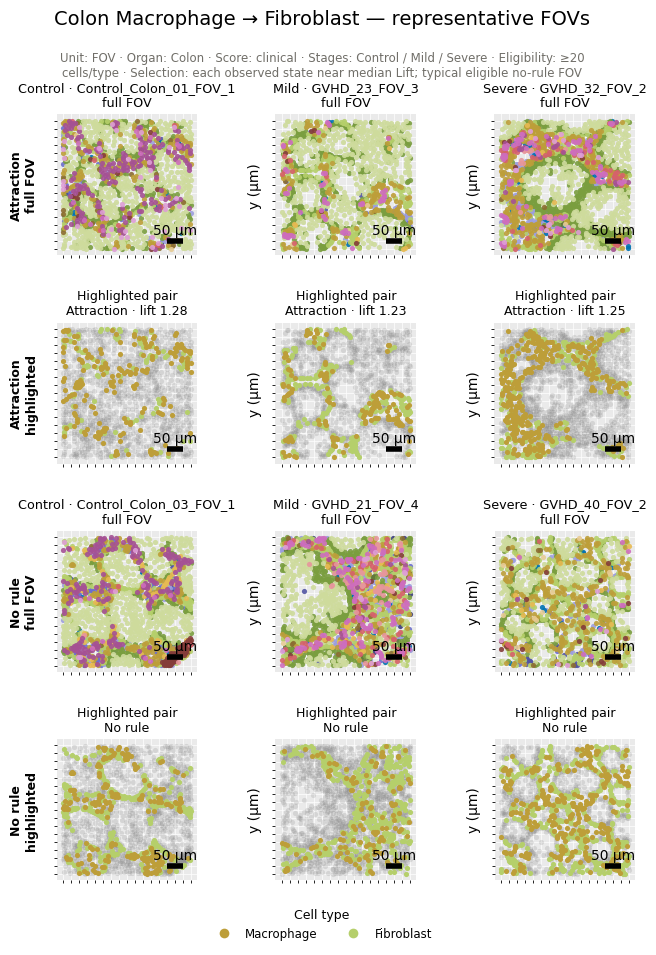

In [6]:
show_selected(0)


**[1] Colon · Fibroblast -> Macrophage** — Intestinal fibroblast and macrophage subsets co-localize.

Fibroblast-derived GM-CSF supports monocyte-to-macrophage differentiation. [Source](https://doi.org/10.1038/s41467-024-46076-3) Human IBD evidence concerns specific subsets; these atlas labels are broader. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
1,All,97,0,22,19,0,10
3,Control,25,0,4,1,0,1
5,Mild,18,0,4,7,0,3
7,Severe,54,0,14,11,0,6


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Fibroblast_to_Macrophage_summary.pdf


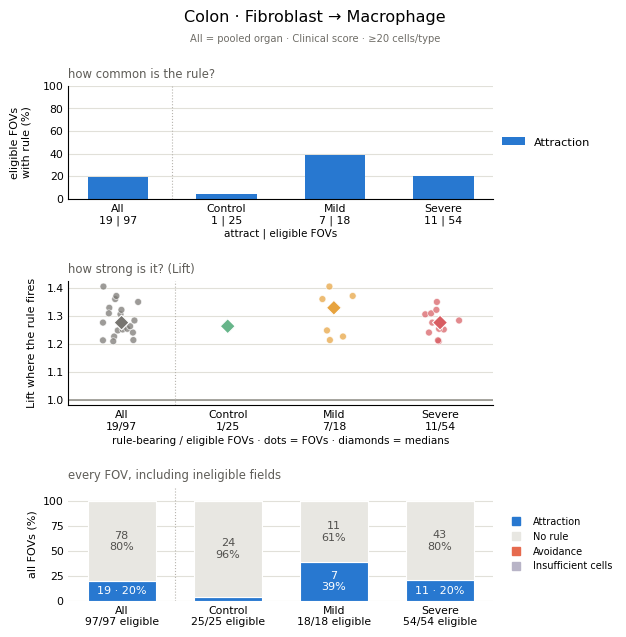

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Fibroblast_to_Macrophage_fovs.pdf


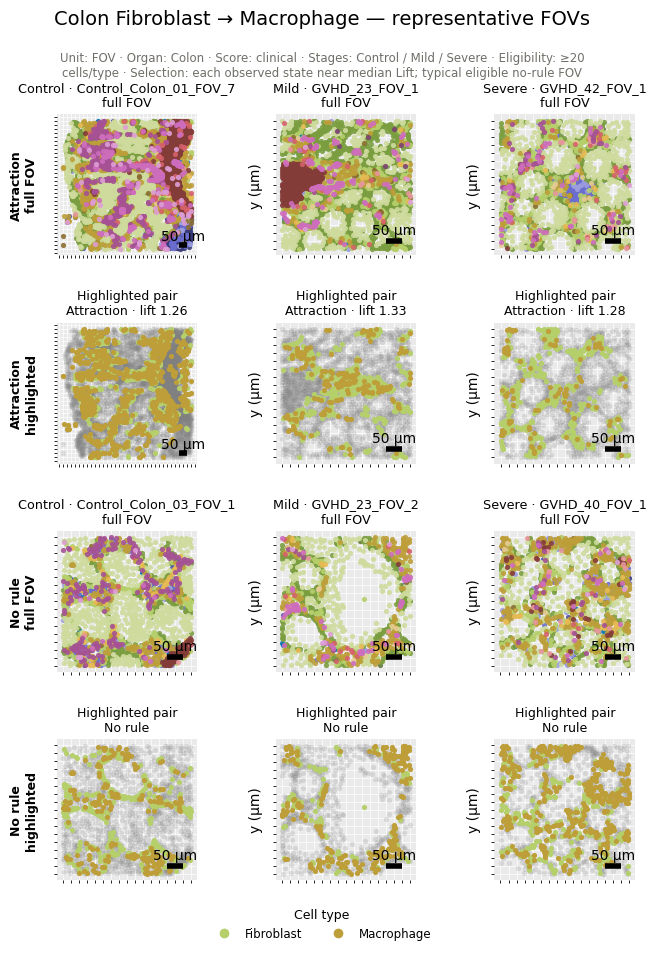

In [7]:
show_selected(1)


**[2] Duodenum · Macrophage -> Fibroblast** — Intestinal fibroblast and macrophage subsets co-localize.

Fibroblast-derived GM-CSF supports monocyte-to-macrophage differentiation. [Source](https://doi.org/10.1038/s41467-024-46076-3) Human IBD evidence concerns specific subsets; these atlas labels are broader. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
8,All,170,0,49,27,0,19
10,Control,31,0,10,2,0,2
12,Mild,98,0,28,20,0,14
14,Severe,41,0,11,5,0,3


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Macrophage_to_Fibroblast_summary.pdf


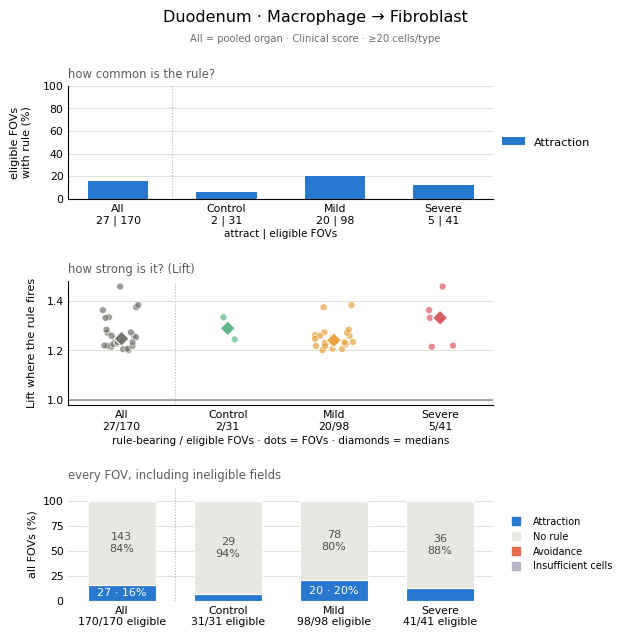

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Macrophage_to_Fibroblast_fovs.pdf


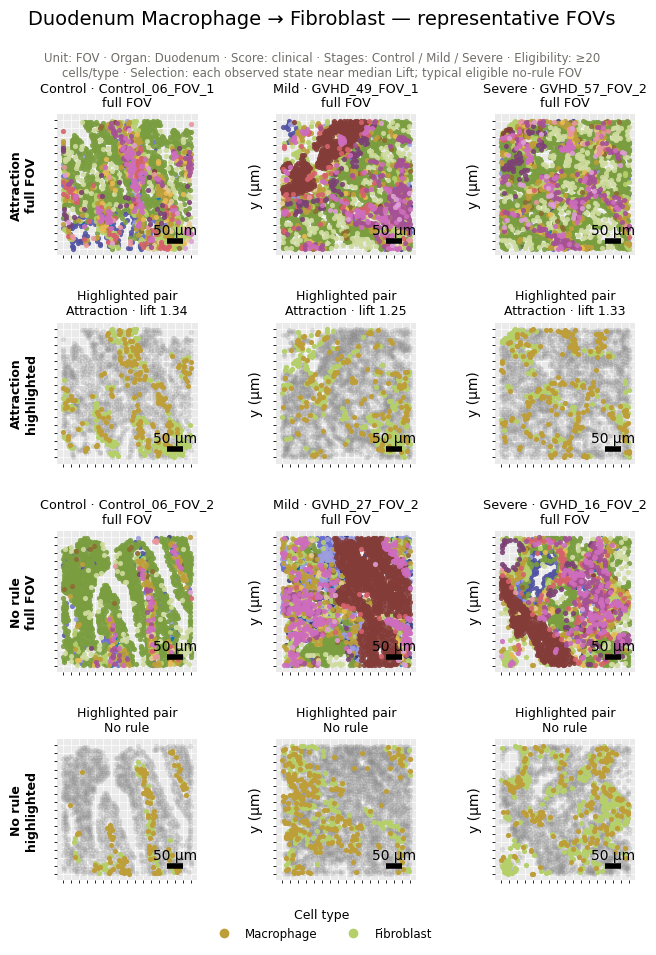

In [8]:
show_selected(2)


**[3] Duodenum · Fibroblast -> Macrophage** — Intestinal fibroblast and macrophage subsets co-localize.

Fibroblast-derived GM-CSF supports monocyte-to-macrophage differentiation. [Source](https://doi.org/10.1038/s41467-024-46076-3) Human IBD evidence concerns specific subsets; these atlas labels are broader. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
9,All,170,0,49,25,0,20
11,Control,31,0,10,0,0,0
13,Mild,98,0,28,20,0,17
15,Severe,41,0,11,5,0,3


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Fibroblast_to_Macrophage_summary.pdf


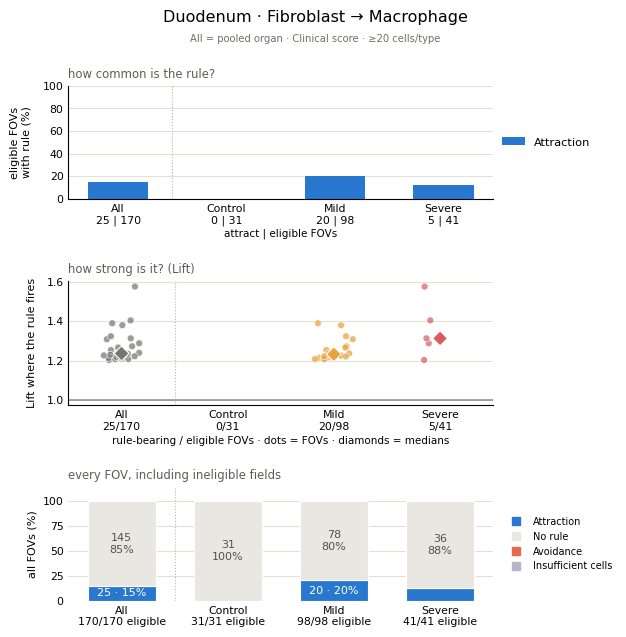

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Fibroblast_to_Macrophage_fovs.pdf


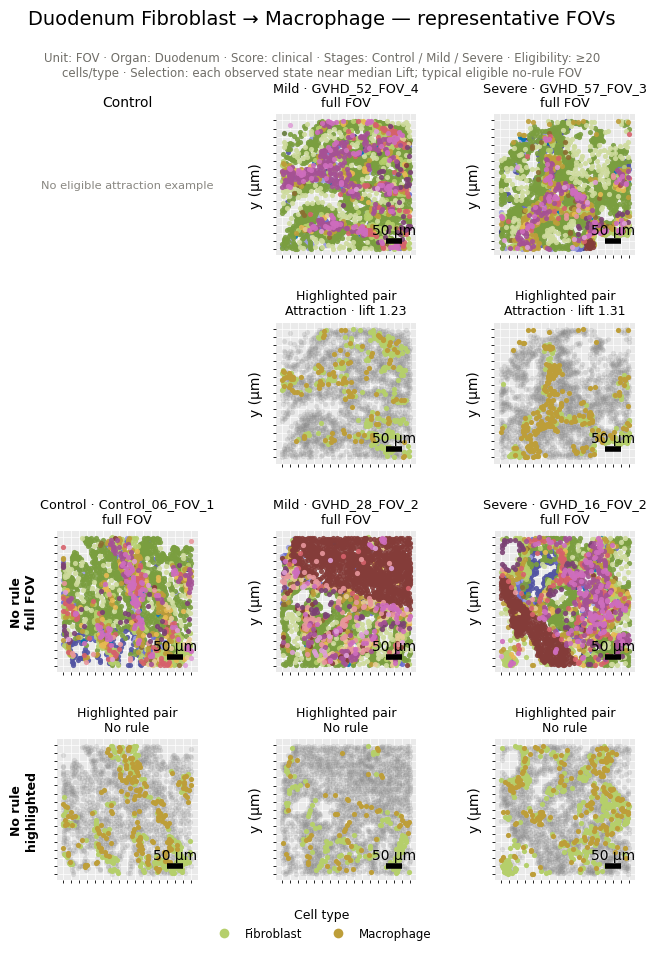

In [9]:
show_selected(3)


**[4] Colon · Macrophage -> Neuron** — Muscularis macrophages associate with enteric neurons.

Macrophage BMP2 acts on neurons; neuronal CSF1 supports macrophages. [Source](https://doi.org/10.1016/j.cell.2014.04.050) Mechanistic mouse evidence; not every atlas macrophage is a muscularis macrophage. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
16,All,60,37,21,6,4,4
18,Control,14,11,4,0,2,0
20,Mild,12,6,4,4,0,2
22,Severe,34,20,13,2,2,2


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Macrophage_to_Neuron_summary.pdf


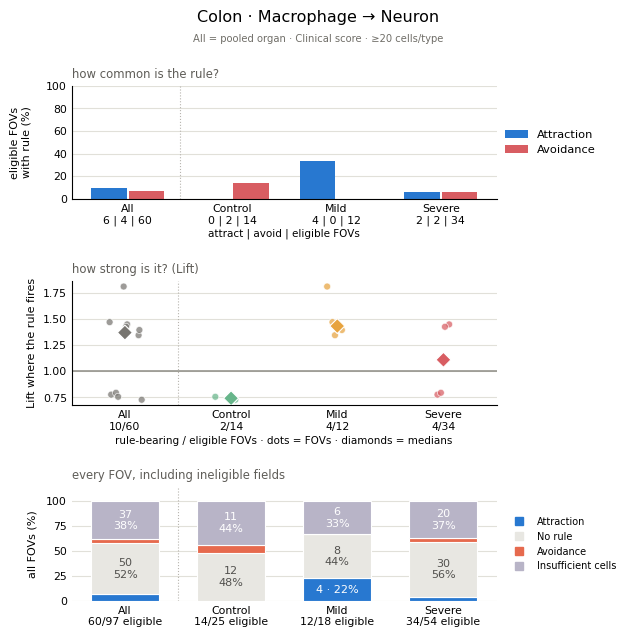

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Macrophage_to_Neuron_fovs_rules.pdf


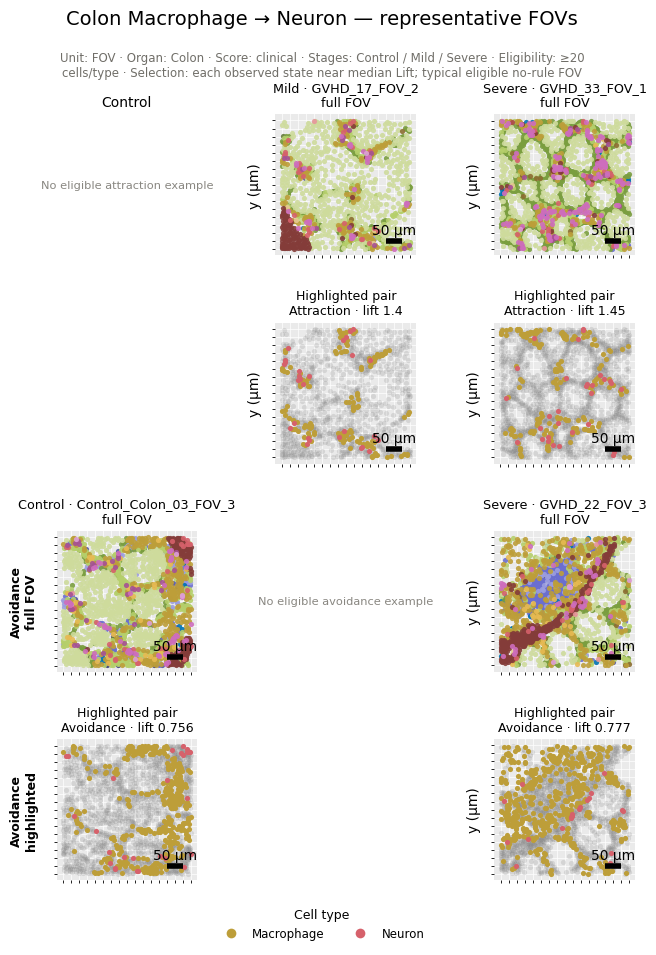

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Macrophage_to_Neuron_fovs_no_rule.pdf


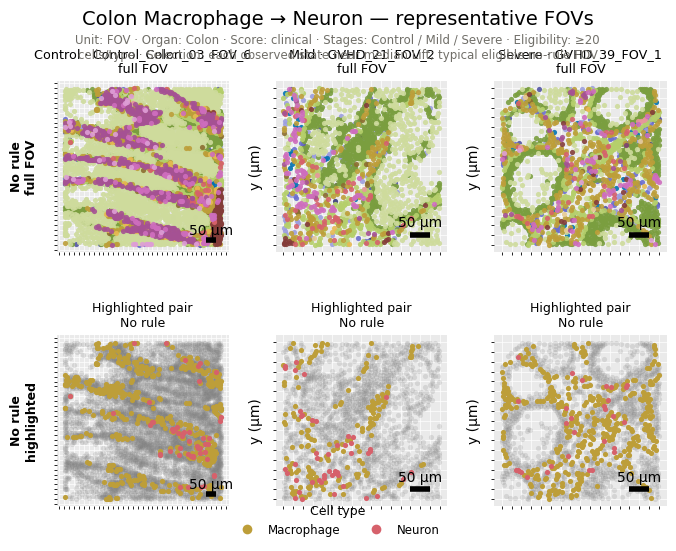

In [10]:
show_selected(4)


**[5] Colon · Neuron -> Macrophage** — Muscularis macrophages associate with enteric neurons.

Macrophage BMP2 acts on neurons; neuronal CSF1 supports macrophages. [Source](https://doi.org/10.1016/j.cell.2014.04.050) Mechanistic mouse evidence; not every atlas macrophage is a muscularis macrophage. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
17,All,60,37,21,18,0,11
19,Control,14,11,4,1,0,1
21,Mild,12,6,4,7,0,2
23,Severe,34,20,13,10,0,8


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Neuron_to_Macrophage_summary.pdf


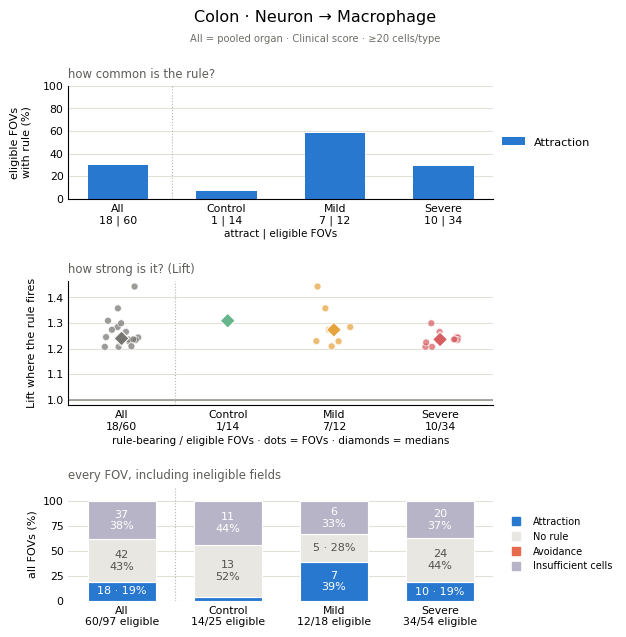

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Neuron_to_Macrophage_fovs.pdf


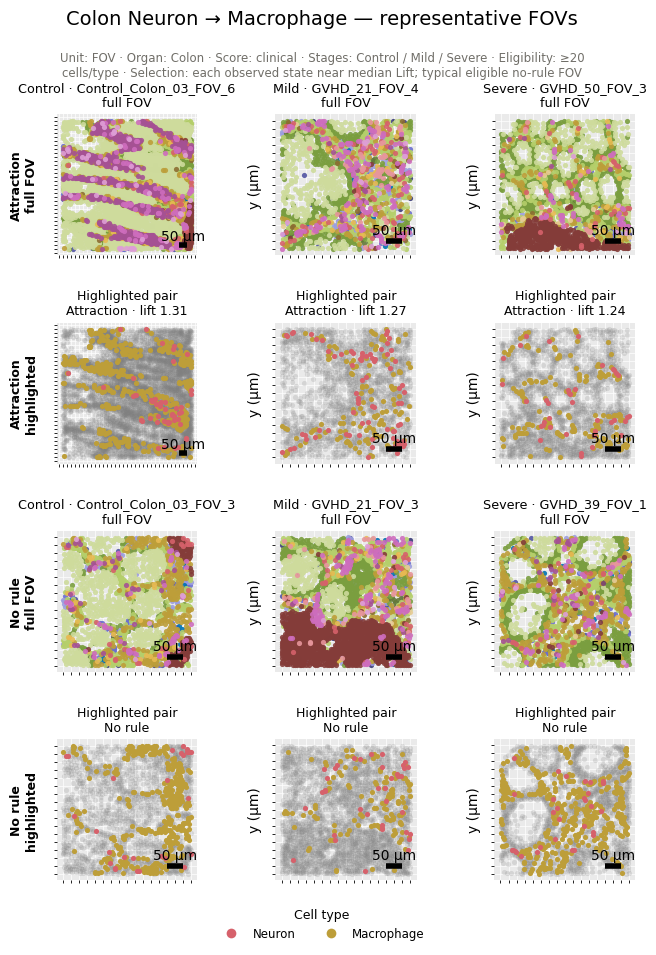

In [11]:
show_selected(5)


**[6] Duodenum · Macrophage -> Neuron** — Muscularis macrophages associate with enteric neurons.

Macrophage BMP2 acts on neurons; neuronal CSF1 supports macrophages. [Source](https://doi.org/10.1016/j.cell.2014.04.050) Mechanistic mouse evidence; not every atlas macrophage is a muscularis macrophage. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
24,All,153,17,47,4,2,4
26,Control,24,7,9,0,0,0
28,Mild,89,9,27,4,1,4
30,Severe,40,1,11,0,1,0


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Macrophage_to_Neuron_summary.pdf


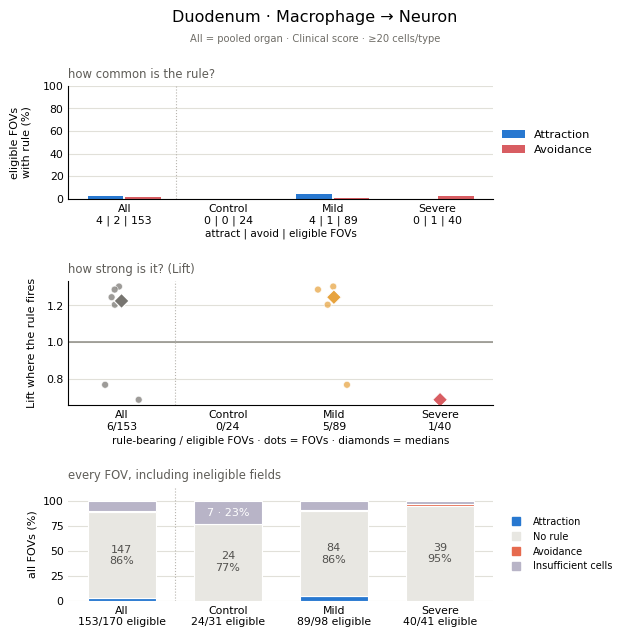

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Macrophage_to_Neuron_fovs_rules.pdf


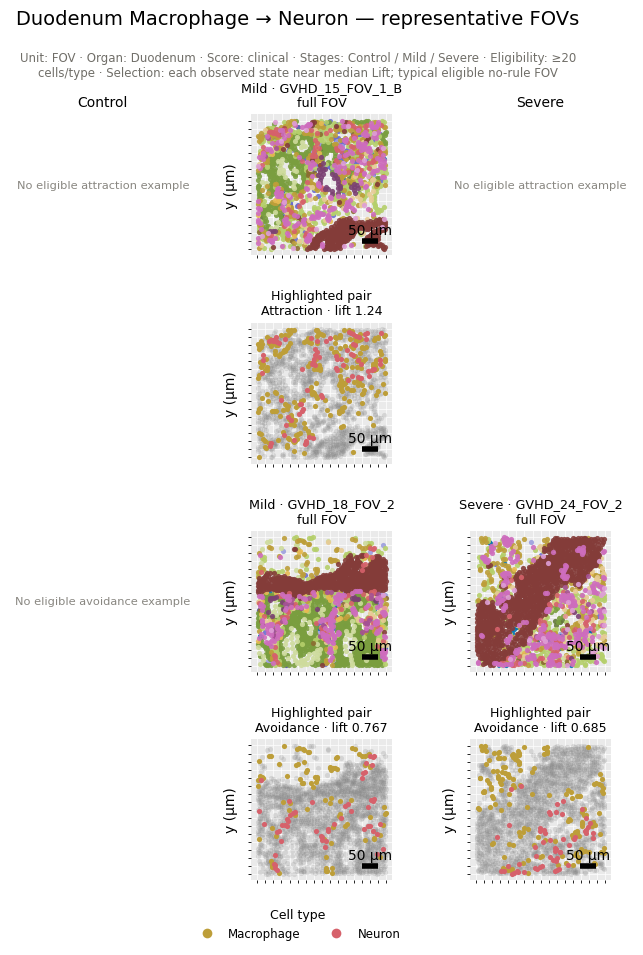

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Macrophage_to_Neuron_fovs_no_rule.pdf


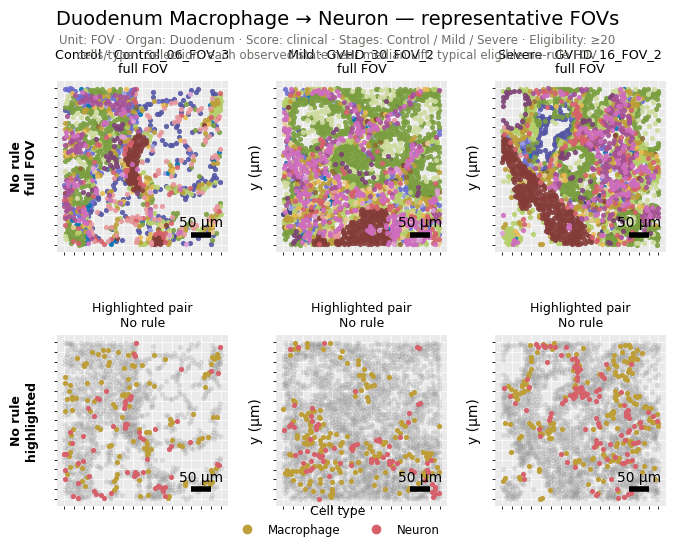

In [12]:
show_selected(6)


**[7] Duodenum · Neuron -> Macrophage** — Muscularis macrophages associate with enteric neurons.

Macrophage BMP2 acts on neurons; neuronal CSF1 supports macrophages. [Source](https://doi.org/10.1016/j.cell.2014.04.050) Mechanistic mouse evidence; not every atlas macrophage is a muscularis macrophage. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
25,All,153,17,47,16,0,13
27,Control,24,7,9,1,0,1
29,Mild,89,9,27,8,0,7
31,Severe,40,1,11,7,0,5


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Neuron_to_Macrophage_summary.pdf


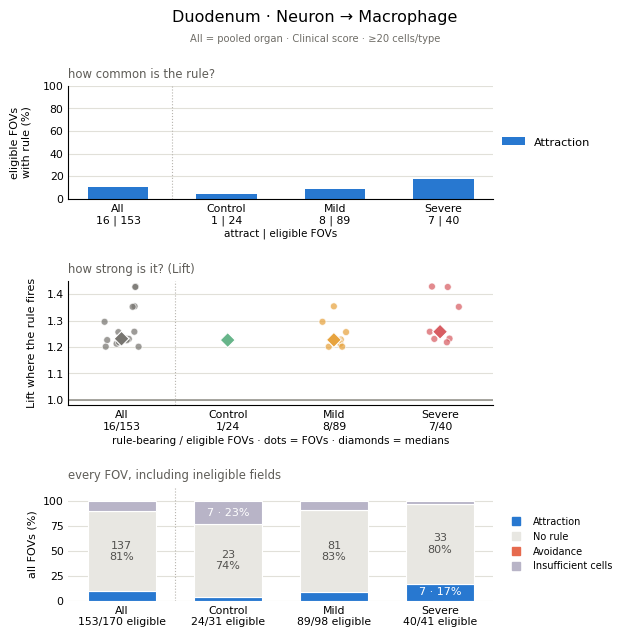

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Neuron_to_Macrophage_fovs.pdf


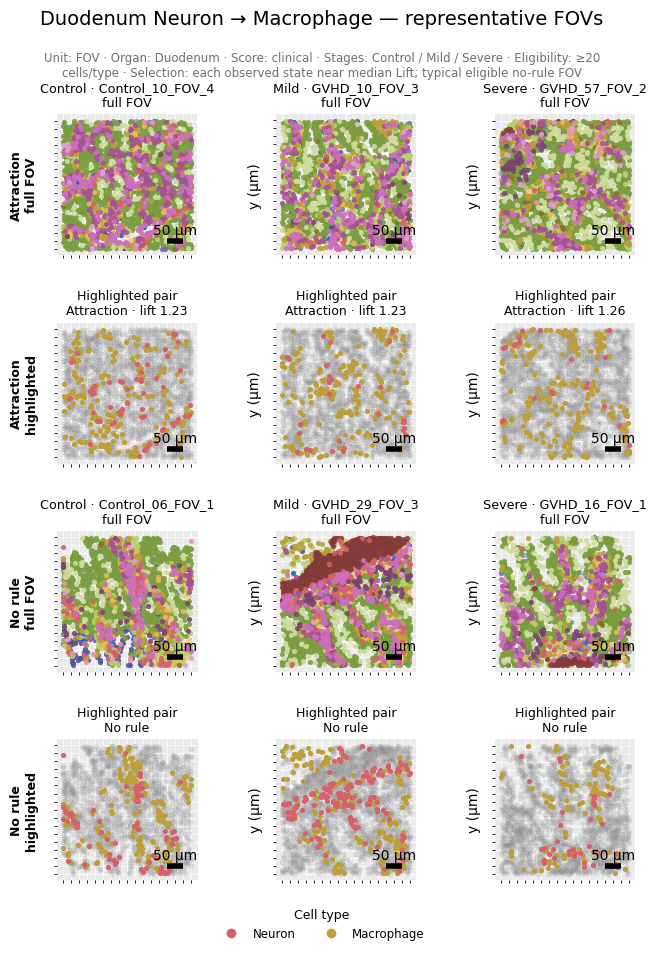

In [13]:
show_selected(7)


**[8] Colon · Fibroblast -> Epithelial** — Subepithelial mesenchymal cells form an epithelial stem-cell niche.

Mesenchymal Wnt supports epithelial stem-cell renewal. [Source](https://doi.org/10.1038/s41586-018-0190-3) Mouse GLI1-positive mesenchyme and stem cells are not separately resolved here. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
32,All,96,1,22,1,2,1
34,Control,25,0,4,0,0,0
36,Mild,18,0,4,1,0,1
38,Severe,53,1,14,0,2,0


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Fibroblast_to_Epithelial_summary.pdf


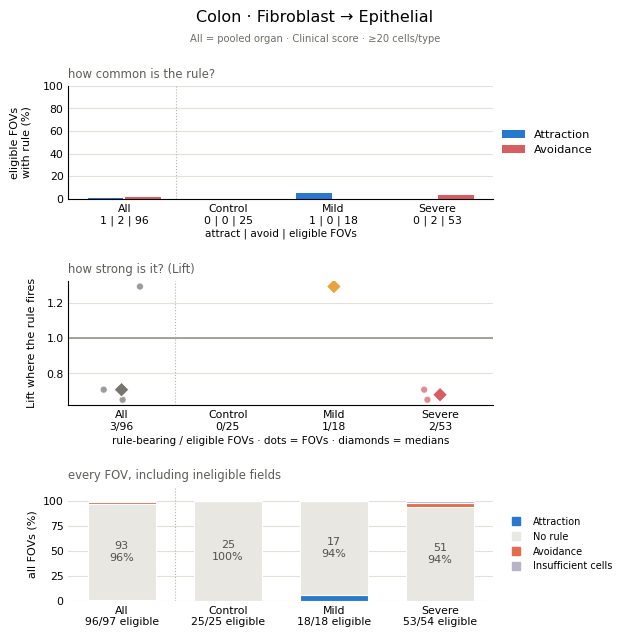

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Fibroblast_to_Epithelial_fovs_rules.pdf


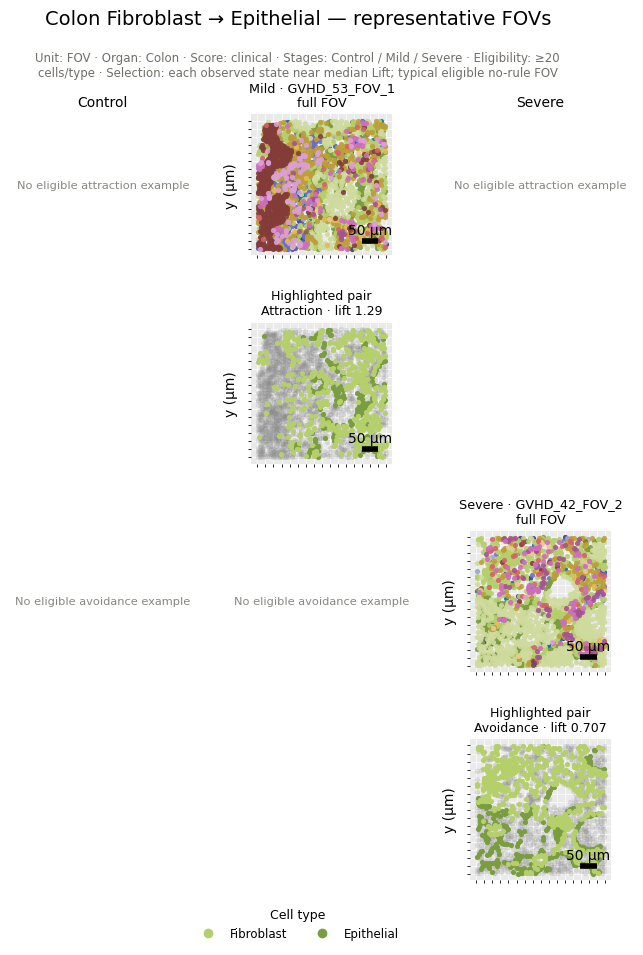

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Fibroblast_to_Epithelial_fovs_no_rule.pdf


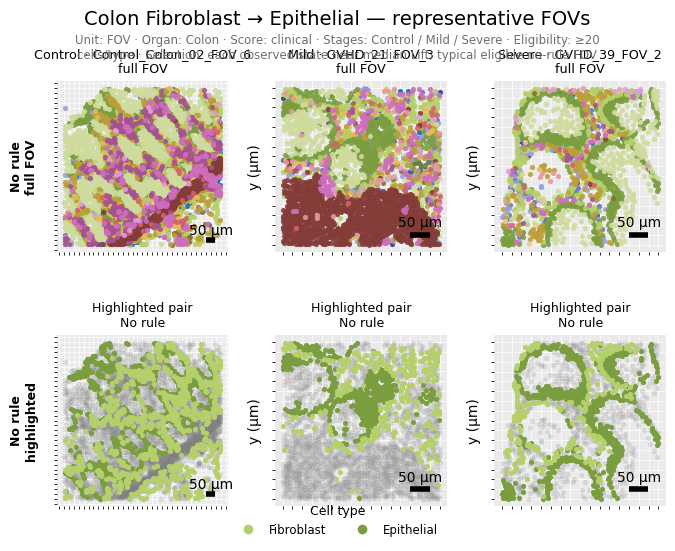

In [14]:
show_selected(8)


**[9] Colon · Epithelial -> Fibroblast** — Subepithelial mesenchymal cells form an epithelial stem-cell niche.

Mesenchymal Wnt supports epithelial stem-cell renewal. [Source](https://doi.org/10.1038/s41586-018-0190-3) Mouse GLI1-positive mesenchyme and stem cells are not separately resolved here. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
33,All,96,1,22,0,1,0
35,Control,25,0,4,0,1,0
37,Mild,18,0,4,0,0,0
39,Severe,53,1,14,0,0,0


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Epithelial_to_Fibroblast_summary.pdf


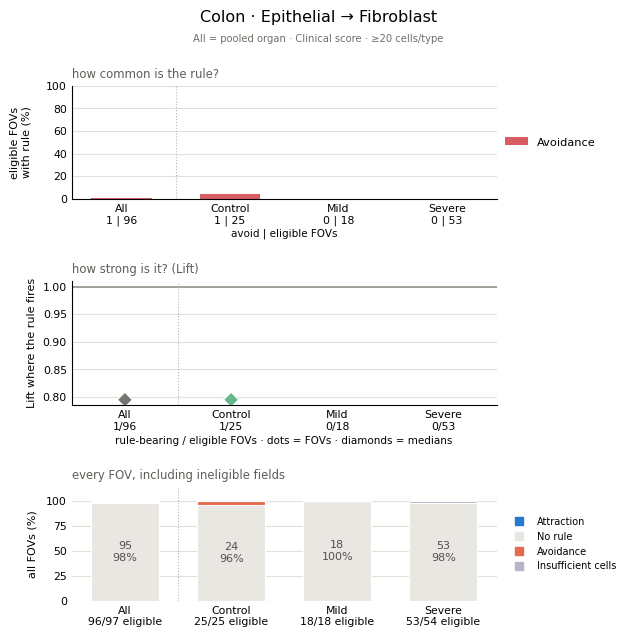

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Epithelial_to_Fibroblast_fovs.pdf


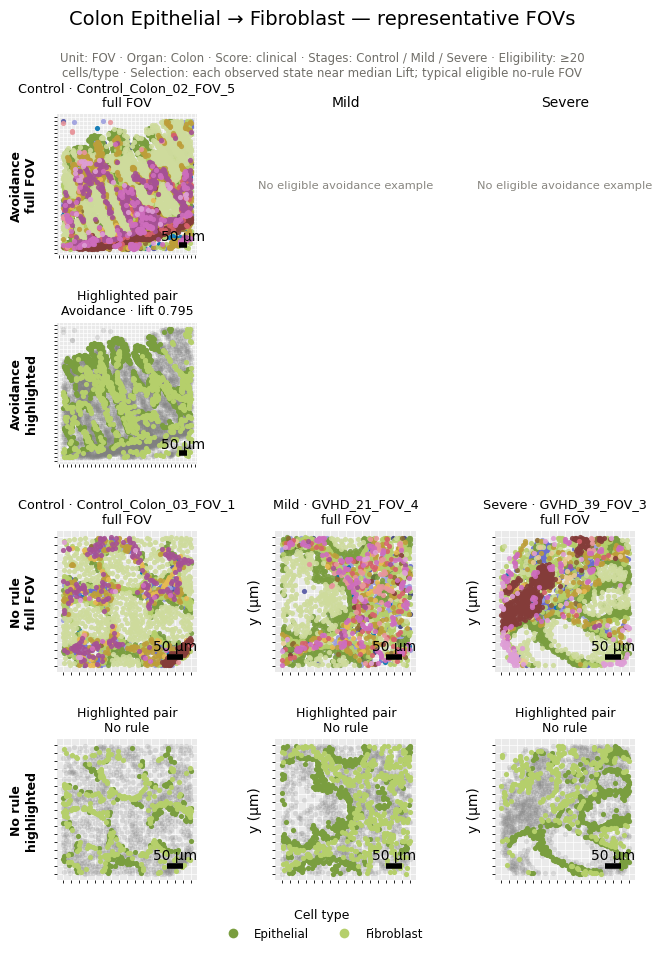

In [15]:
show_selected(9)


**[10] Duodenum · Fibroblast -> Epithelial** — Subepithelial mesenchymal cells form an epithelial stem-cell niche.

Mesenchymal Wnt supports epithelial stem-cell renewal. [Source](https://doi.org/10.1038/s41586-018-0190-3) Mouse GLI1-positive mesenchyme and stem cells are not separately resolved here. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
40,All,160,10,49,1,4,1
42,Control,31,0,10,0,1,0
44,Mild,96,2,28,1,2,1
46,Severe,33,8,11,0,1,0


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Fibroblast_to_Epithelial_summary.pdf


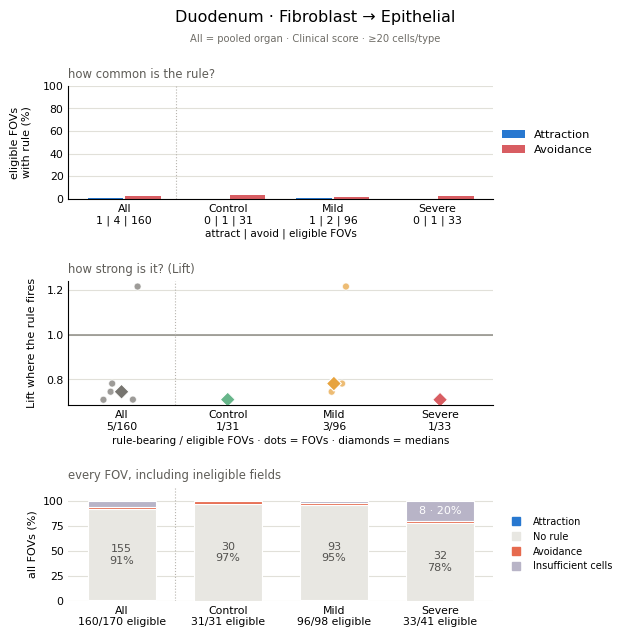

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Fibroblast_to_Epithelial_fovs_rules.pdf


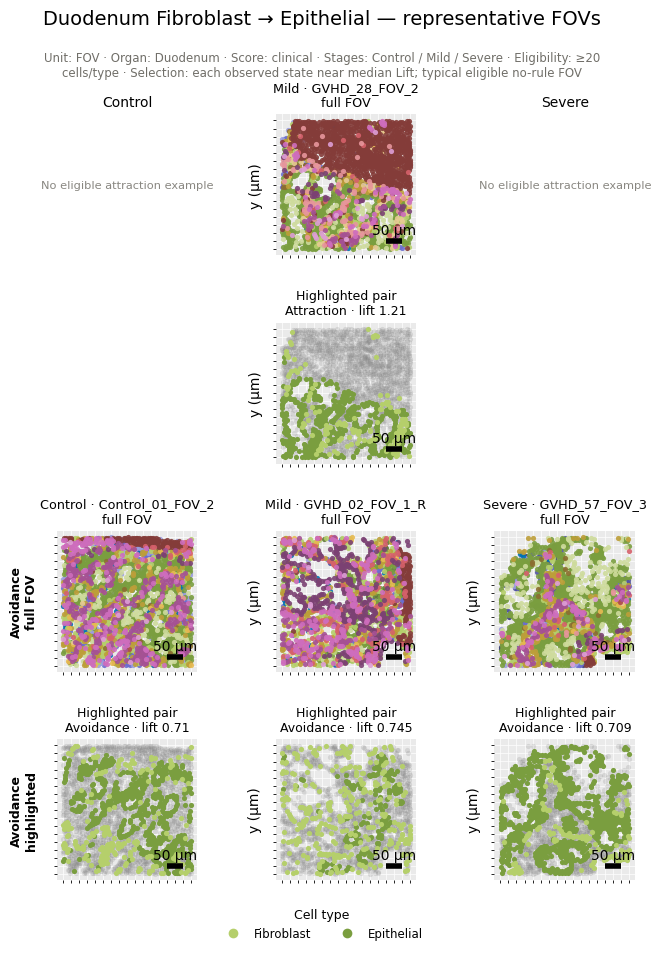

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Fibroblast_to_Epithelial_fovs_no_rule.pdf


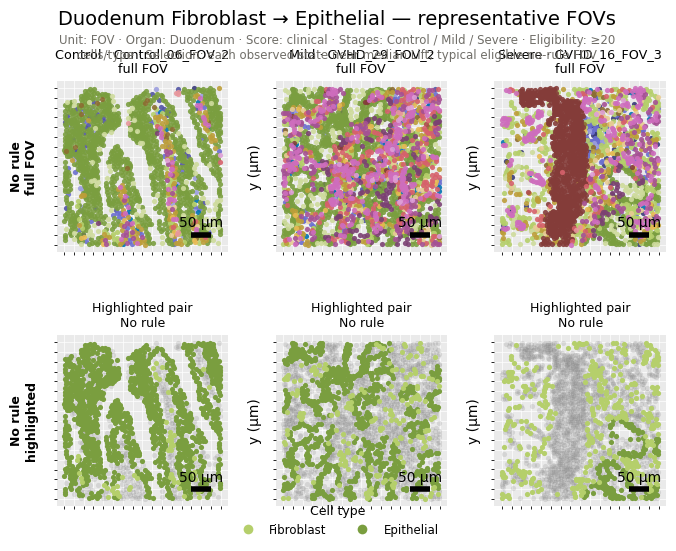

In [16]:
show_selected(10)


**[11] Duodenum · Epithelial -> Fibroblast** — Subepithelial mesenchymal cells form an epithelial stem-cell niche.

Mesenchymal Wnt supports epithelial stem-cell renewal. [Source](https://doi.org/10.1038/s41586-018-0190-3) Mouse GLI1-positive mesenchyme and stem cells are not separately resolved here. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
41,All,160,10,49,0,13,0
43,Control,31,0,10,0,2,0
45,Mild,96,2,28,0,8,0
47,Severe,33,8,11,0,3,0


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Epithelial_to_Fibroblast_summary.pdf


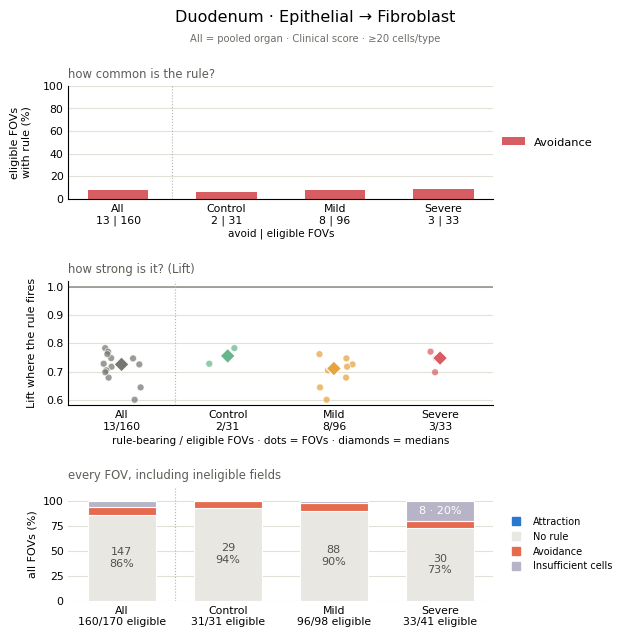

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Epithelial_to_Fibroblast_fovs.pdf


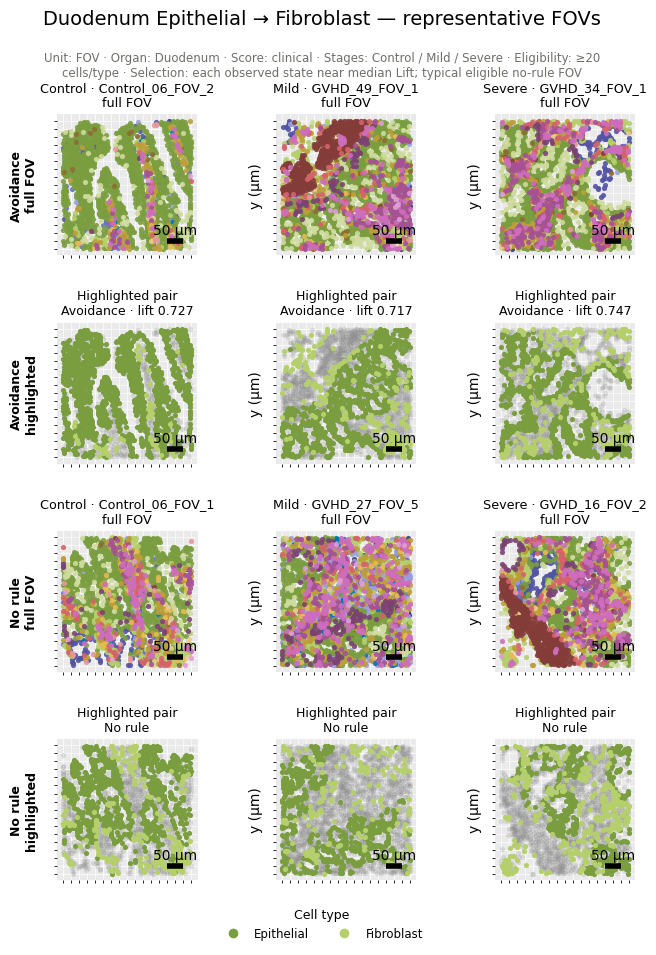

In [17]:
show_selected(11)


**[12] Duodenum · Paneth -> Epithelial** — Paneth cells contact epithelial stem cells in small-intestinal crypts.

Paneth cells provide Wnt, EGF and Notch niche signals to stem cells. [Source](https://doi.org/10.1038/nature09637) The Epithelial label includes more than LGR5-positive stem cells; mouse evidence. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
48,All,81,89,36,46,1,28
50,Control,13,18,8,10,0,8
52,Mild,55,43,23,29,1,16
54,Severe,13,28,5,7,0,4


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Paneth_to_Epithelial_summary.pdf


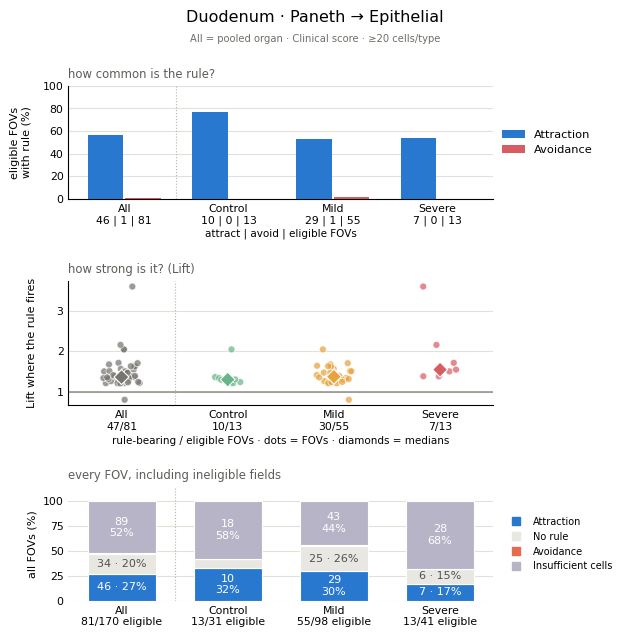

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Paneth_to_Epithelial_fovs_rules.pdf


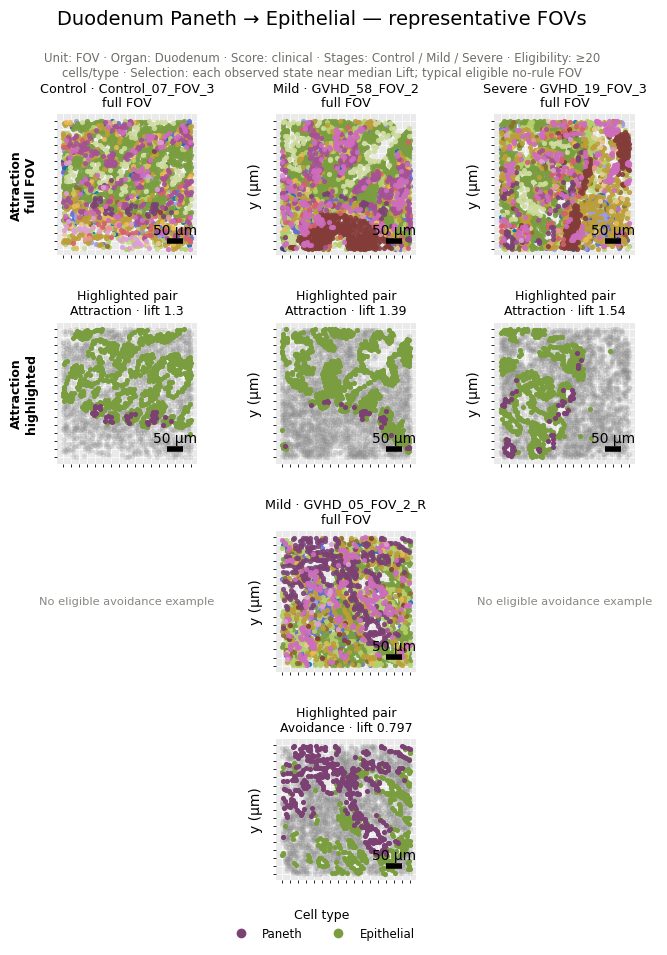

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Paneth_to_Epithelial_fovs_no_rule.pdf


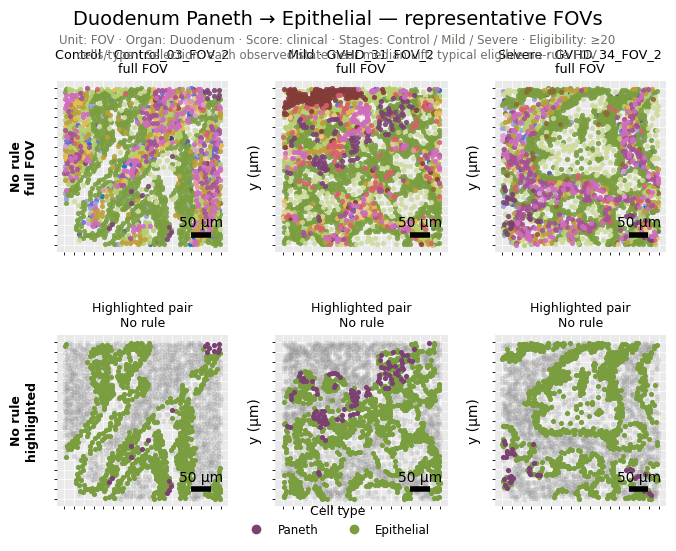

In [18]:
show_selected(12)


**[13] Duodenum · Epithelial -> Paneth** — Paneth cells contact epithelial stem cells in small-intestinal crypts.

Paneth cells provide Wnt, EGF and Notch niche signals to stem cells. [Source](https://doi.org/10.1038/nature09637) The Epithelial label includes more than LGR5-positive stem cells; mouse evidence. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
49,All,81,89,36,8,1,7
51,Control,13,18,8,0,0,0
53,Mild,55,43,23,6,1,5
55,Severe,13,28,5,2,0,2


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Epithelial_to_Paneth_summary.pdf


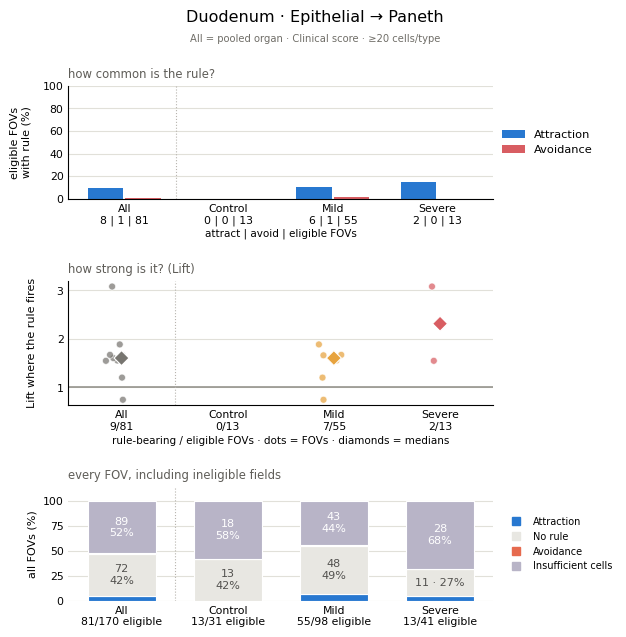

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Epithelial_to_Paneth_fovs_rules.pdf


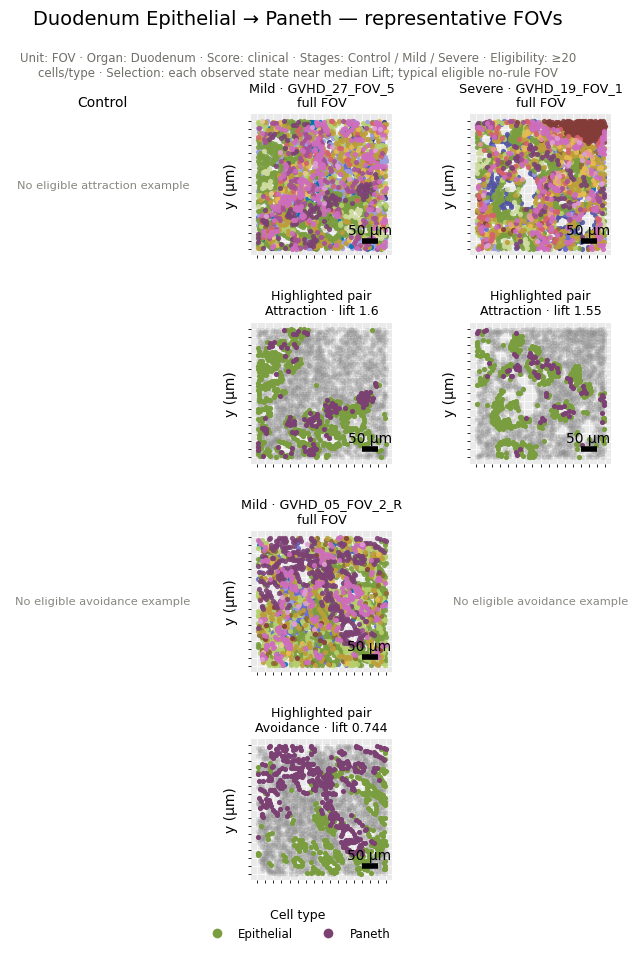

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Epithelial_to_Paneth_fovs_no_rule.pdf


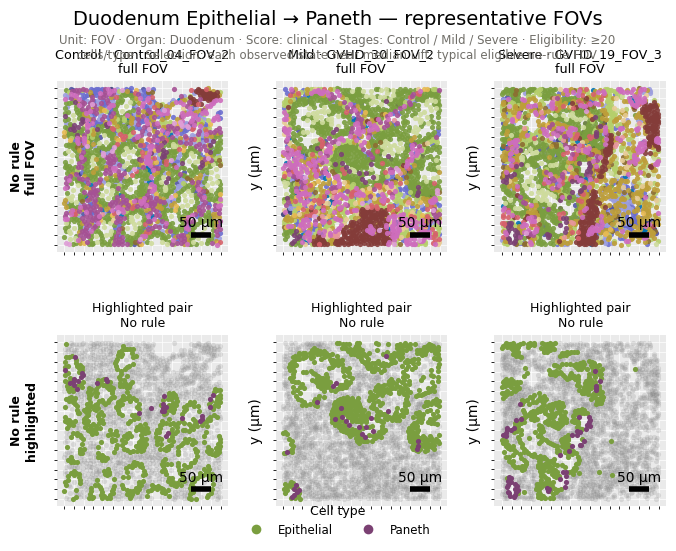

In [19]:
show_selected(13)


**[14] Colon · Plasma -> Epithelial** — Mucosal plasma cells occupy APRIL-rich survival niches near epithelial structures.

APRIL supports plasma-cell survival; its cellular source differs by intestinal location. [Source](https://doi.org/10.1172/JCI33760) The study found no small-intestinal epithelial APRIL production; neutrophils supplied APRIL there. Proximity cannot identify the producer. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
56,All,55,42,15,4,4,4
58,Control,25,0,4,3,3,3
60,Mild,4,14,2,0,0,0
62,Severe,26,28,9,1,1,1


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Plasma_to_Epithelial_summary.pdf


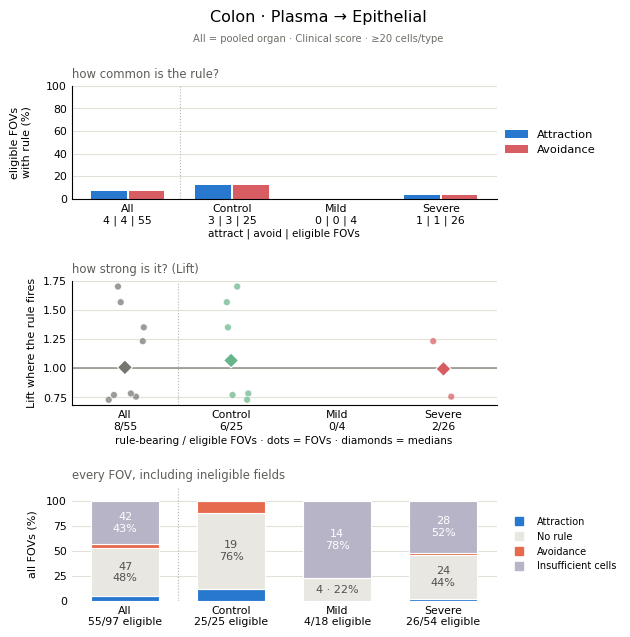

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Plasma_to_Epithelial_fovs_rules.pdf


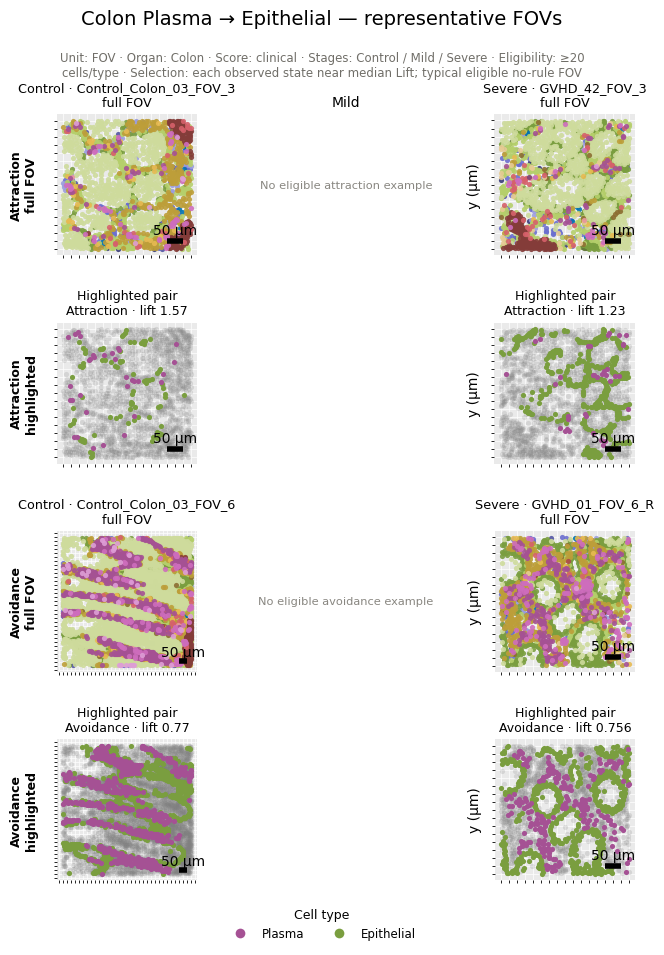

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Plasma_to_Epithelial_fovs_no_rule.pdf


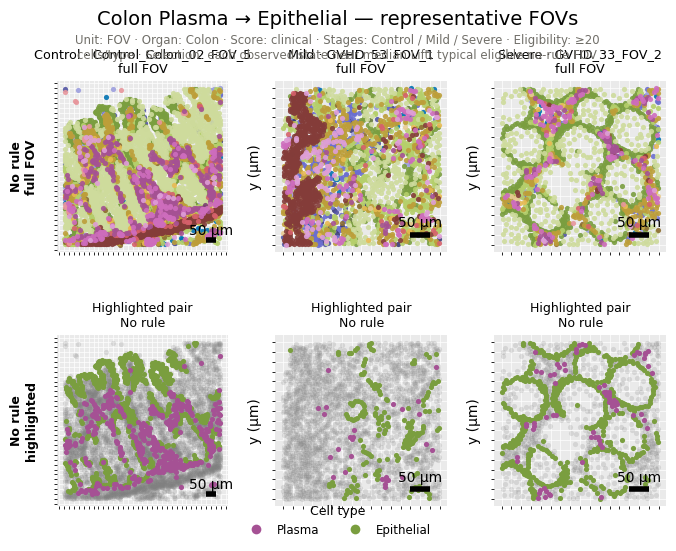

In [20]:
show_selected(14)


**[15] Colon · Epithelial -> Plasma** — Mucosal plasma cells occupy APRIL-rich survival niches near epithelial structures.

APRIL supports plasma-cell survival; its cellular source differs by intestinal location. [Source](https://doi.org/10.1172/JCI33760) The study found no small-intestinal epithelial APRIL production; neutrophils supplied APRIL there. Proximity cannot identify the producer. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
57,All,55,42,15,0,5,0
59,Control,25,0,4,0,3,0
61,Mild,4,14,2,0,0,0
63,Severe,26,28,9,0,2,0


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Epithelial_to_Plasma_summary.pdf


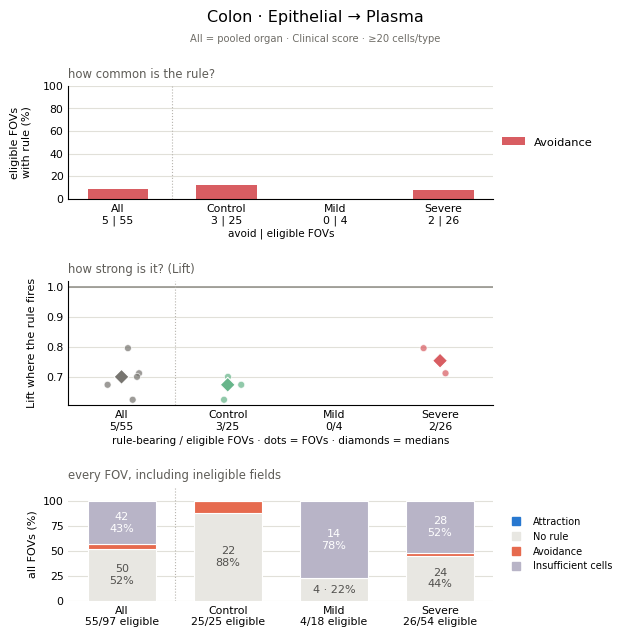

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Epithelial_to_Plasma_fovs.pdf


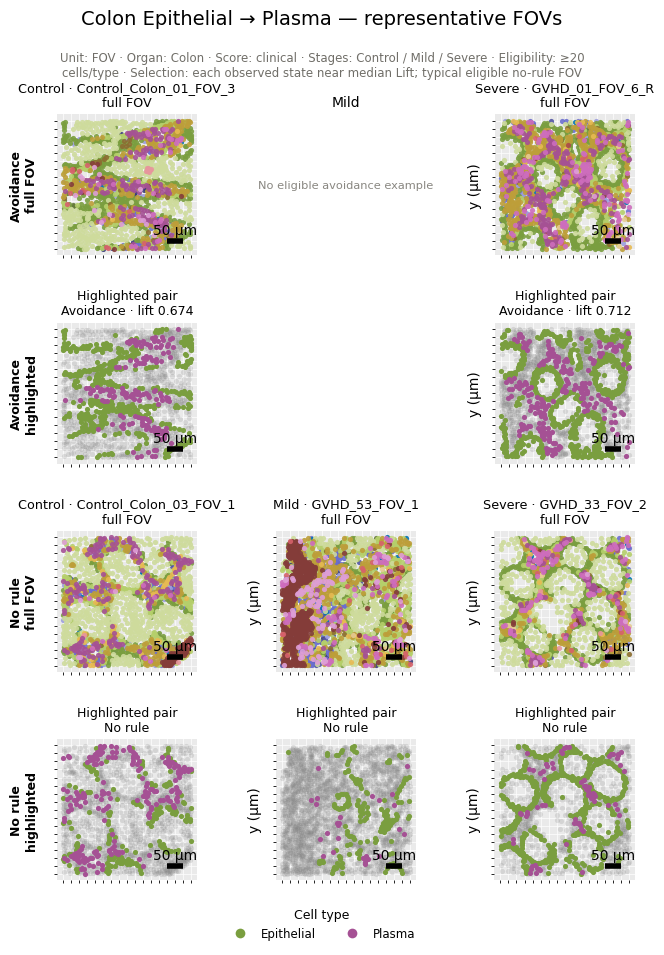

In [21]:
show_selected(15)


**[16] Duodenum · Plasma -> Epithelial** — Mucosal plasma cells occupy APRIL-rich survival niches near epithelial structures.

APRIL supports plasma-cell survival; its cellular source differs by intestinal location. [Source](https://doi.org/10.1172/JCI33760) The study found no small-intestinal epithelial APRIL production; neutrophils supplied APRIL there. Proximity cannot identify the producer. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
64,All,135,35,47,11,2,10
66,Control,30,1,10,3,0,3
68,Mild,77,21,26,7,2,6
70,Severe,28,13,11,1,0,1


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Plasma_to_Epithelial_summary.pdf


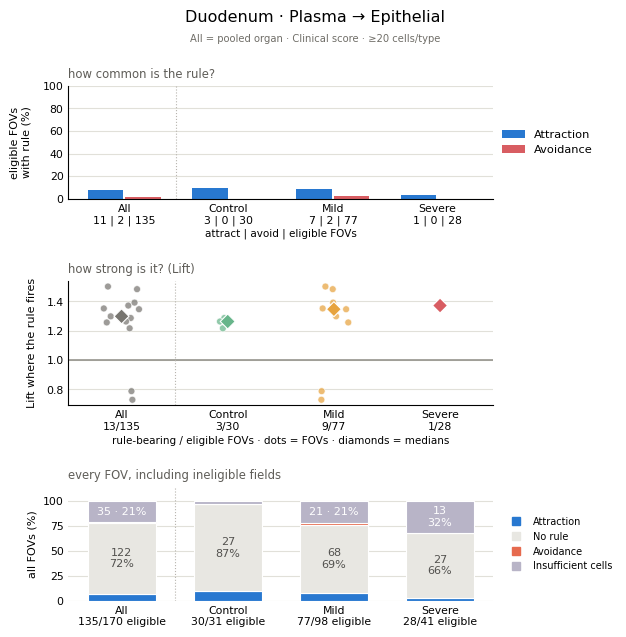

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Plasma_to_Epithelial_fovs_rules.pdf


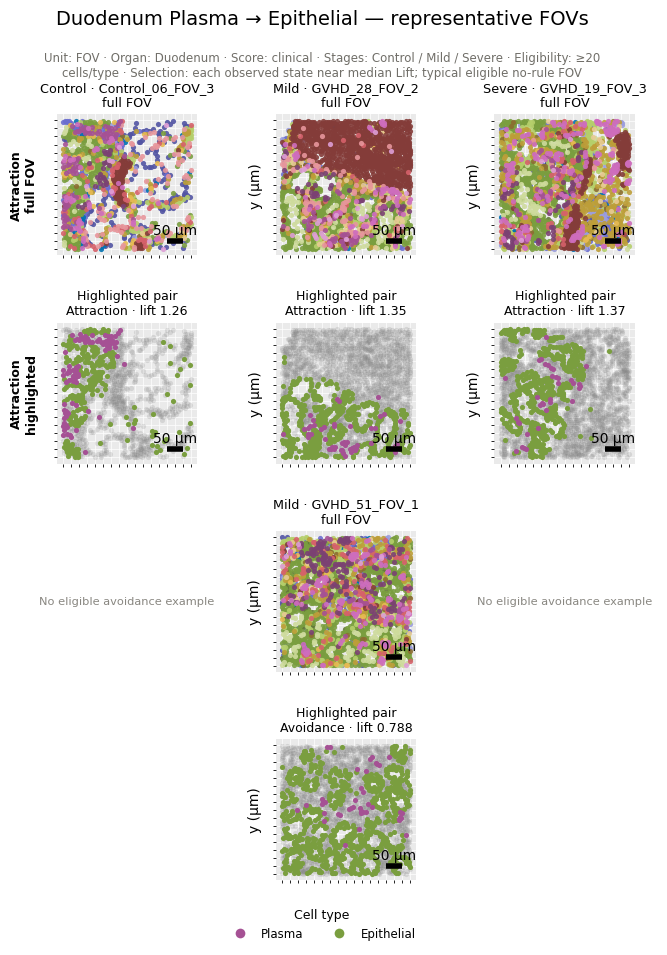

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Plasma_to_Epithelial_fovs_no_rule.pdf


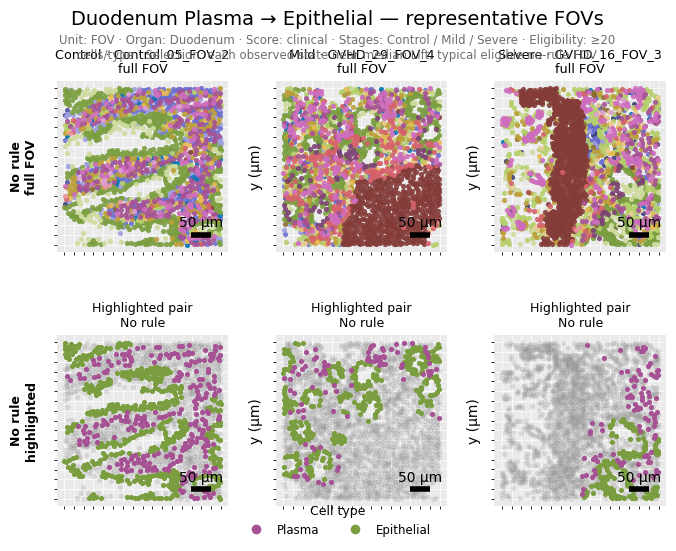

In [22]:
show_selected(16)


**[17] Duodenum · Epithelial -> Plasma** — Mucosal plasma cells occupy APRIL-rich survival niches near epithelial structures.

APRIL supports plasma-cell survival; its cellular source differs by intestinal location. [Source](https://doi.org/10.1172/JCI33760) The study found no small-intestinal epithelial APRIL production; neutrophils supplied APRIL there. Proximity cannot identify the producer. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
65,All,135,35,47,0,8,0
67,Control,30,1,10,0,3,0
69,Mild,77,21,26,0,4,0
71,Severe,28,13,11,0,1,0


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Epithelial_to_Plasma_summary.pdf


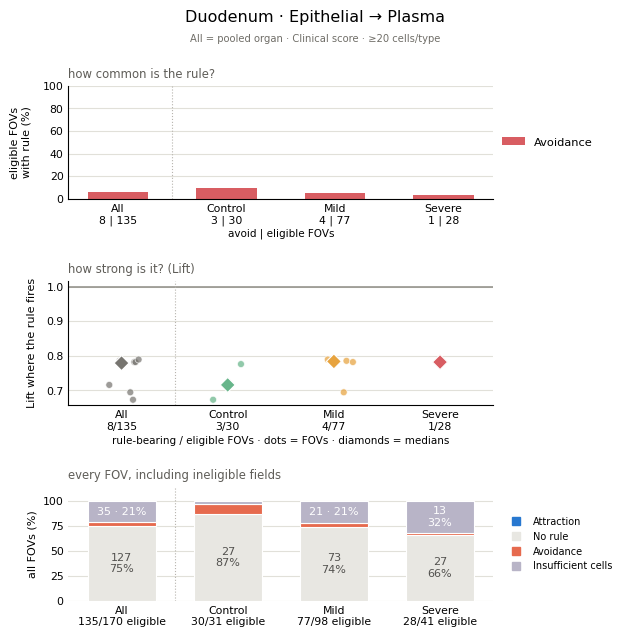

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Epithelial_to_Plasma_fovs.pdf


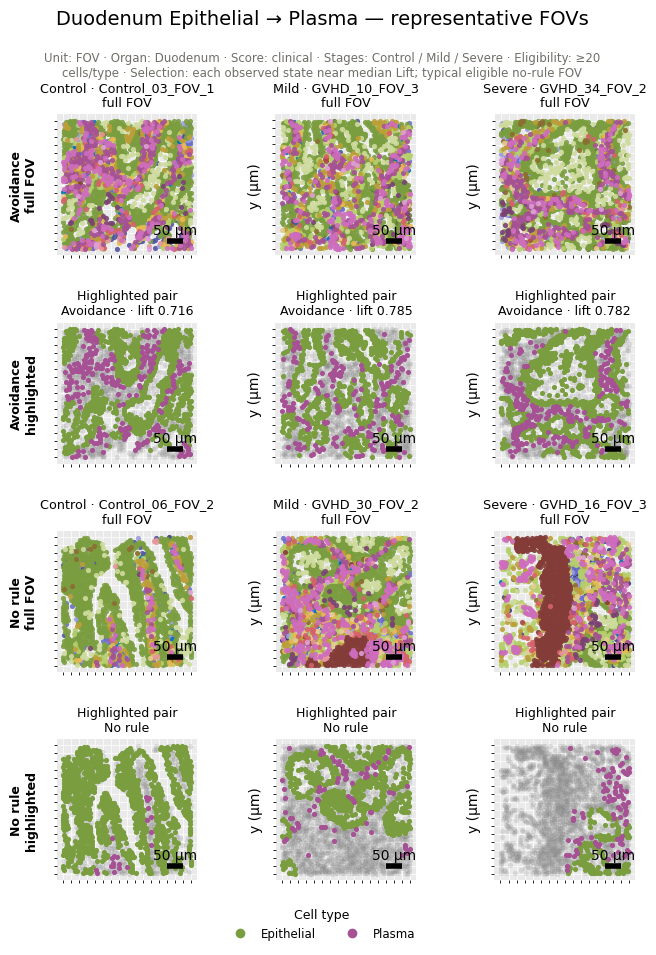

In [23]:
show_selected(17)


**[18] Colon · SMV -> Endothelial** — Vascular smooth muscle and endothelial cells form adjacent vessel-wall compartments.

Endothelial PDGF-B recruits/supports PDGFR-beta-positive mural cells during development. [Source](https://doi.org/10.1242/dev.126.14.3047) Mouse vascular-development evidence; adult gut proximity cannot validate developmental signaling. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
72,All,37,60,17,26,0,15
74,Control,15,10,4,11,0,4
76,Mild,3,15,2,1,0,1
78,Severe,19,35,11,14,0,10


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_SMV_to_Endothelial_summary.pdf


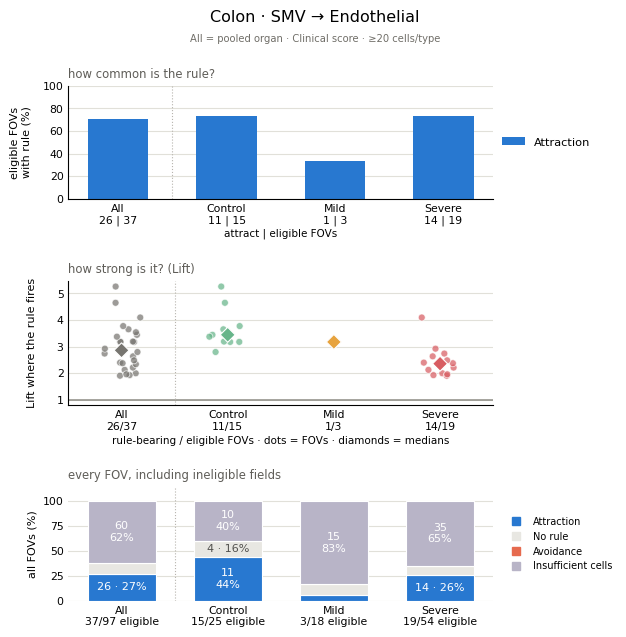

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_SMV_to_Endothelial_fovs.pdf


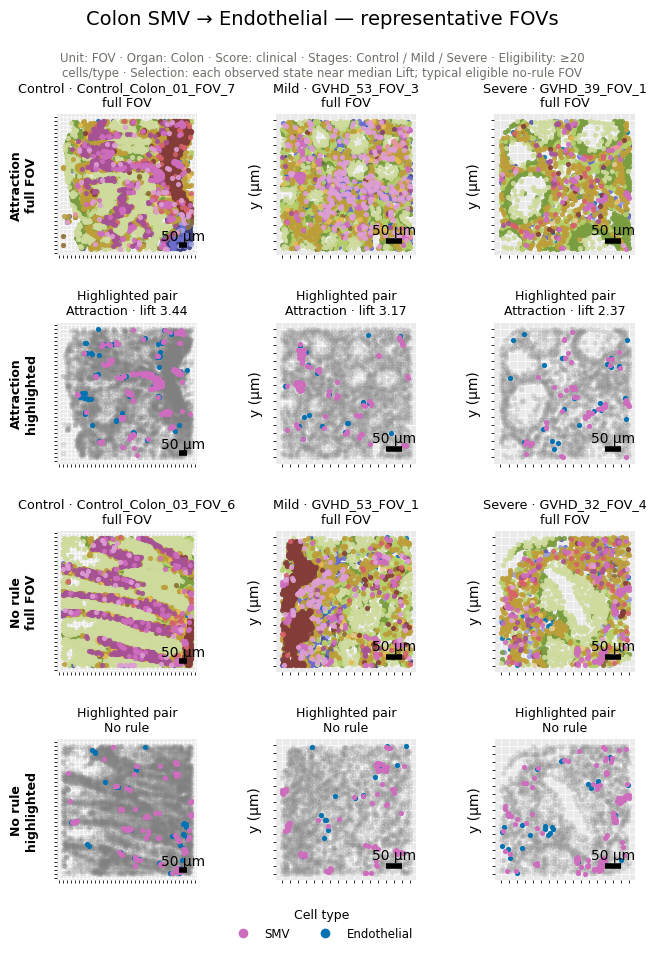

In [24]:
show_selected(18)


**[19] Colon · Endothelial -> SMV** — Vascular smooth muscle and endothelial cells form adjacent vessel-wall compartments.

Endothelial PDGF-B recruits/supports PDGFR-beta-positive mural cells during development. [Source](https://doi.org/10.1242/dev.126.14.3047) Mouse vascular-development evidence; adult gut proximity cannot validate developmental signaling. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
73,All,37,60,17,12,0,9
75,Control,15,10,4,6,0,3
77,Mild,3,15,2,0,0,0
79,Severe,19,35,11,6,0,6


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Endothelial_to_SMV_summary.pdf


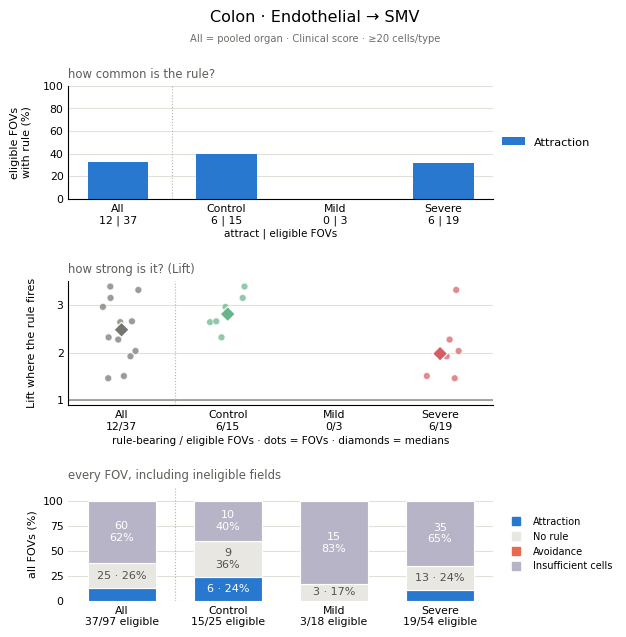

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Colon_Endothelial_to_SMV_fovs.pdf


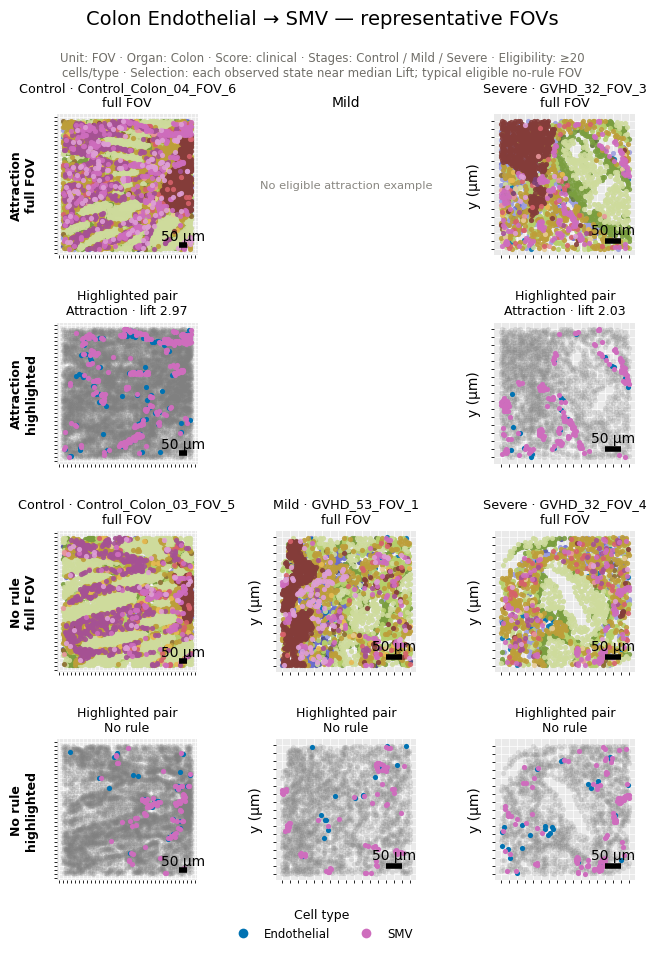

In [25]:
show_selected(19)


**[20] Duodenum · SMV -> Endothelial** — Vascular smooth muscle and endothelial cells form adjacent vessel-wall compartments.

Endothelial PDGF-B recruits/supports PDGFR-beta-positive mural cells during development. [Source](https://doi.org/10.1242/dev.126.14.3047) Mouse vascular-development evidence; adult gut proximity cannot validate developmental signaling. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
80,All,104,66,42,47,0,27
82,Control,17,14,9,4,0,3
84,Mild,61,37,24,30,0,18
86,Severe,26,15,9,13,0,6


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_SMV_to_Endothelial_summary.pdf


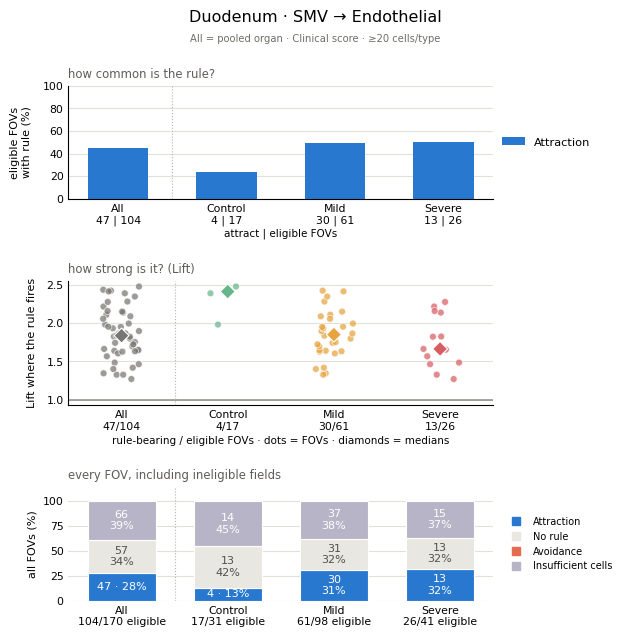

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_SMV_to_Endothelial_fovs.pdf


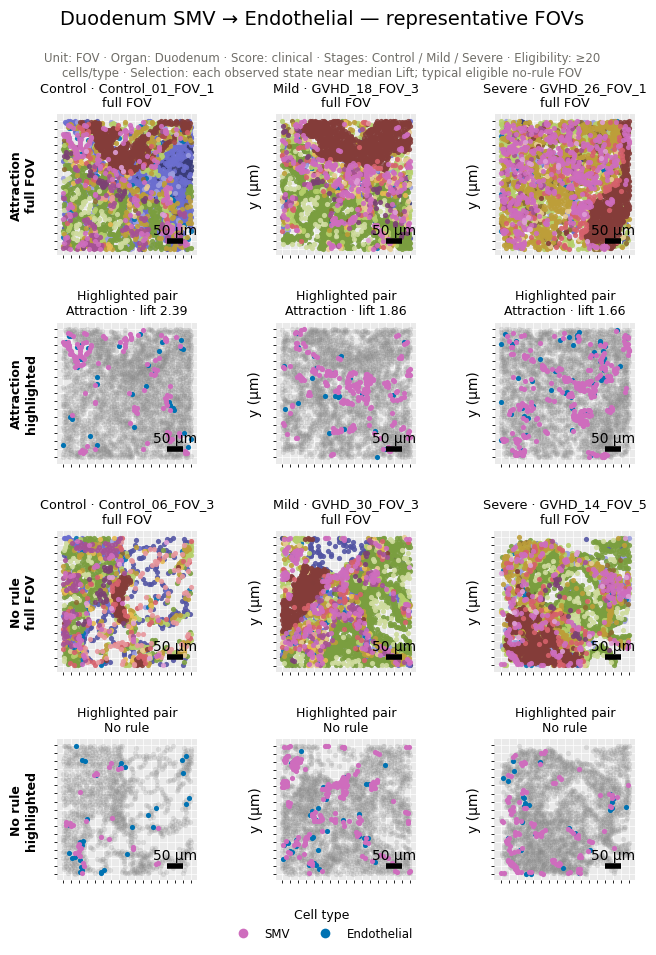

In [26]:
show_selected(20)


**[21] Duodenum · Endothelial -> SMV** — Vascular smooth muscle and endothelial cells form adjacent vessel-wall compartments.

Endothelial PDGF-B recruits/supports PDGFR-beta-positive mural cells during development. [Source](https://doi.org/10.1242/dev.126.14.3047) Mouse vascular-development evidence; adult gut proximity cannot validate developmental signaling. Spatial arrows do not establish signaling direction.

,stage,eligible,ineligible,eligible_patients,attraction,avoidance,attraction_patients
81,All,104,66,42,30,0,17
83,Control,17,14,9,1,0,1
85,Mild,61,37,24,21,0,12
87,Severe,26,15,9,8,0,4


saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Endothelial_to_SMV_summary.pdf


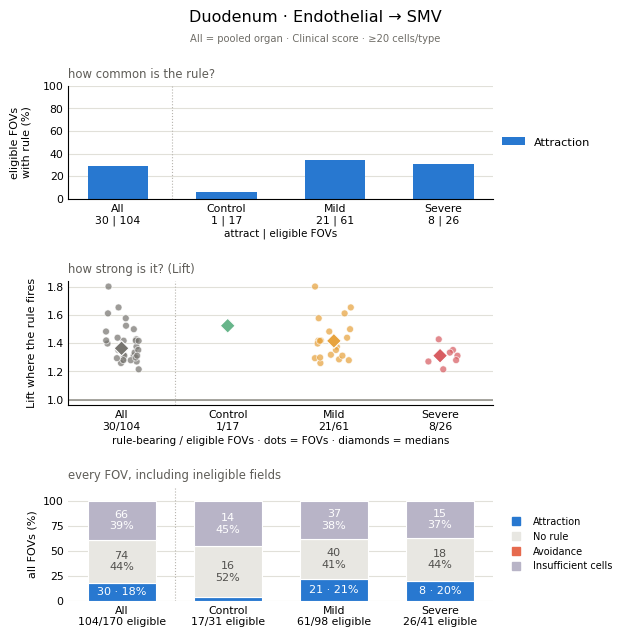

saved C:\Users\Owner\Documents\script-rule-mining\result_summary\differential_rules\summary_downloads\biology_Duodenum_Endothelial_to_SMV_fovs.pdf


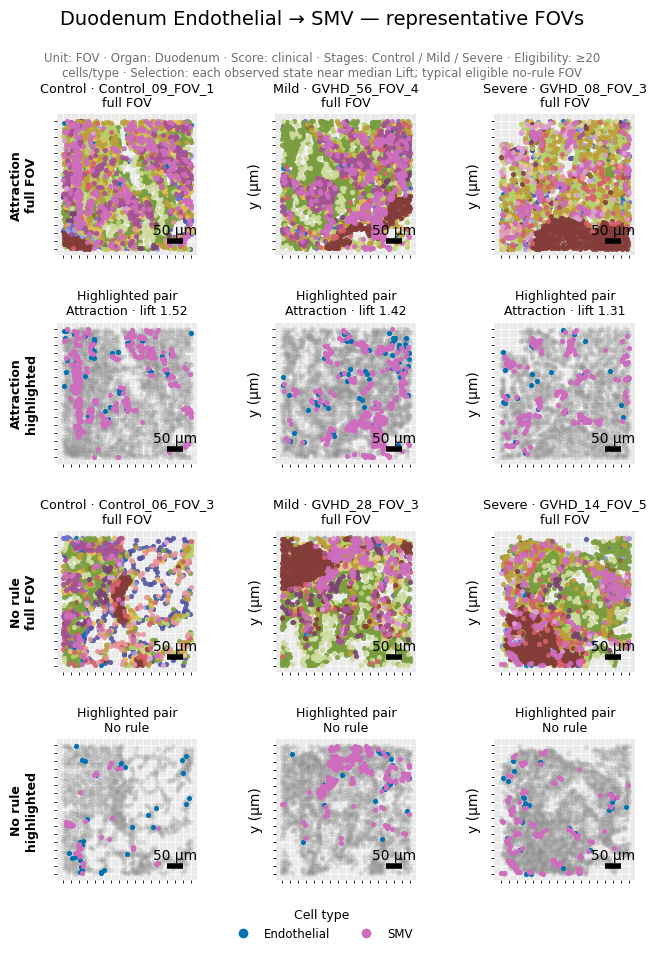

In [27]:
show_selected(21)


## What can we conclude?

Focus on how often the mined rule recurs, its Lift, and where it appears in tissue. Patient statistics support interpretation but are not a display cutoff. Neither prevalence nor Lift identifies a signaling sender or receiver.

Keep all outcomes here, including unrecovered pairs. Only informative, adequately populated findings enter Method proof. Compare Control with disease groups before treating a disease-associated arrangement as normal anatomy.

Current-run interpretation (reassess after changing the run):

- **SMV–Endothelial:** strongest anatomical check. Mined attraction and paired excess both favor SMV centers in both organs; the excess difference has the same sign in 16/17 colon and 40/42 duodenal patients. The paired mined-frequency test passes FDR in colon (0.0021), but not duodenum (0.080). Published endothelial-to-mural signaling runs in the opposite direction, so the spatial arrow cannot validate that signaling mechanism.
- **Paneth–Epithelial:** 46/81 versus 8/81 eligible FOVs show attraction; mined frequency favors Paneth centers in 26/28 non-tied patients and paired excess in 31/36 patients (both FDR <0.001). Paneth-centered raw proximity is already near its random-label expectation, so this supports restricted niche geometry, not additional enrichment or stem-cell-specific signaling.
- **Macrophage–Neuron:** in colon, mined occurrence favors Neuron centers, whereas excess proximity favors Macrophage centers. The known partnership is a useful context, but this disagreement rules out interpreting occurrence frequency as molecular direction.
- **Macrophage–Fibroblast:** duodenal attraction recurs in 27/170 fields across 19/49 patients, versus 25/170 fields across 20/49 patients in reverse. The modest Lift and tissue examples are worth showing as localized recurrence, despite directional FDR 1. This does not establish a preferred arrow or the subset-specific signaling mechanism.
- **Fibroblast–Epithelial:** only one attracting FOV per organ in the forward direction and none in reverse; the proposed positive control is not convincingly recovered with these broad labels.
- **Plasma–Epithelial:** attracting rules are sparse and all-field excess is negative; this does not validate the APRIL survival-niche mechanism.

In [28]:
display(evidence[(evidence.stage == "All") & (evidence.endpoint == "mined_difference")][
    ["pair", "Organ", "stage", "endpoint", "patients", "nonzero_patients", "positive", "negative", "median_pp", "fdr"]
])
print("Literature-validated molecular directionality: not established by these spatial rules.")

,pair,Organ,stage,endpoint,patients,nonzero_patients,positive,negative,median_pp,fdr
3,Fibroblast / Epithelial,Colon,All,mined_difference,22,1,1,0,0,NaN
19,Fibroblast / Epithelial,Duodenum,All,mined_difference,49,1,1,0,0,NaN
35,Macrophage / Fibroblast,Colon,All,mined_difference,22,7,1,6,0,0.1671
51,Macrophage / Fibroblast,Duodenum,All,mined_difference,49,19,9,10,0,1
67,Macrophage / Neuron,Colon,All,mined_difference,21,10,0,10,0,0.005282
83,Macrophage / Neuron,Duodenum,All,mined_difference,47,15,3,12,0,0.06247
99,Paneth / Epithelial,Duodenum,All,mined_difference,36,28,26,2,66.67,2.255e-05
115,Plasma / Epithelial,Colon,All,mined_difference,15,4,4,0,0,NaN
131,Plasma / Epithelial,Duodenum,All,mined_difference,47,10,10,0,0,0.005282
147,SMV / Endothelial,Colon,All,mined_difference,17,12,12,0,40,0.002075


Literature-validated molecular directionality: not established by these spatial rules.


## Secondary spatial audit

These calculations are not the plotted Lift or the mining null. In all eligible FOVs, measure the fraction of A centers with ≥1 B within the recorded radius; the random-label expectation is `1 − C(N−1−n_B,k)/C(N−1,k)` for a center with k neighbors. Excess is observed minus expected; `difference` compares the two excesses. This controls overall partner frequency and degree, not tissue compartments, and does not use mining patch filters. The mining null fixes Epithelial labels in this run.

FOV values are averaged within biopsy, then biopsies within patient. One BH family includes all pairs, organs, pooled/stage groups and four endpoints: the two excesses, their difference, and the paired mined-attraction difference. Overlapping groups are not independent replications. These checks cannot establish molecular signaling direction.


In [29]:
display(evidence[evidence.stage == "All"].reset_index(drop=True))


,pair,Organ,stage,endpoint,patients,nonzero_patients,positive,negative,mean_pp,median_pp,p_value,fdr
0,Fibroblast / Epithelial,Colon,All,excess_ab,22,22,0,22,-25.41,-23.31,4.768e-07,4.365e-06
1,Fibroblast / Epithelial,Colon,All,excess_ba,22,22,0,22,-15.21,-12.39,4.768e-07,4.365e-06
2,Fibroblast / Epithelial,Colon,All,difference,22,22,4,18,-10.2,-11.2,0.004344,0.009752
3,Fibroblast / Epithelial,Colon,All,mined_difference,22,1,1,0,1.136,0,NaN,NaN
4,Fibroblast / Epithelial,Duodenum,All,excess_ab,49,49,0,49,-30.32,-30.49,3.553e-15,4.228e-13
5,Fibroblast / Epithelial,Duodenum,All,excess_ba,49,49,2,47,-23.17,-22.97,4.356e-12,1.037e-10
6,Fibroblast / Epithelial,Duodenum,All,difference,49,49,13,36,-7.154,-7.61,0.001403,0.004769
7,Fibroblast / Epithelial,Duodenum,All,mined_difference,49,1,1,0,0.6803,0,NaN,NaN
8,Macrophage / Fibroblast,Colon,All,excess_ab,22,22,1,21,-2.489,-2.22,1.097e-05,7.677e-05
9,Macrophage / Fibroblast,Colon,All,excess_ba,22,22,4,18,-1.545,-2.149,0.004344,0.009752
